Test the hypothesis that the early phase of UNet learning learn a linear convolutional structure that denoise the noise to be patch like

In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
import sys
import os
from os.path import join
import json
import pickle as pkl
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
import torchvision
import torchvision.transforms as transforms
from tqdm.auto import trange, tqdm
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from easydict import EasyDict as edict
sys.path.append("/n/home12/binxuwang/Github/DiffusionLearningCurve")
sys.path.append("/Users/binxuwang/Github/DiffusionLearningCurve/")
from core.diffusion_nn_lib import UNetBlockStyleMLP_backbone
from core.toy_shape_dataset_lib import generate_random_star_shape_torch
from core.diffusion_basics_lib import *
from core.diffusion_edm_lib import *
from core.network_edm_lib import SongUNet, DhariwalUNet
from core.DiT_model_lib import *
from core.diffusion_nn_lib import UNetBlockStyleMLP_backbone
from circuit_toolkit.plot_utils import saveallforms, to_imgrid, show_imgrid
from pprint import pprint

saveroot = f"/n/holylfs06/LABS/kempner_fellow_binxuwang/Users/binxuwang/DL_Projects/DiffusionSpectralLearningCurve"

In [6]:
def find_all_ckpt_steps(ckptdir, verbose=True):
    ckpt_files = [f for f in os.listdir(ckptdir) if f.startswith("model_epoch_") and f.endswith(".pth")]
    ckpt_steps = [int(f.split("_")[-1].split(".")[0]) for f in ckpt_files]
    if verbose:
        print(f"Found {len(ckpt_steps)} checkpoints in the directory, largest step is {max(ckpt_steps)}")
    return sorted(ckpt_steps)


def create_unet_model(config):
    unet = SongUNet(in_channels=config.channels, 
                out_channels=config.channels, 
                num_blocks=config.layers_per_block, 
                attn_resolutions=config.attn_resolutions, 
                decoder_init_attn=config.decoder_init_attn if 'decoder_init_attn' in config else True,
                model_channels=config.model_channels, 
                channel_mult=config.channel_mult, 
                dropout=config.dropout, 
                img_resolution=config.img_size, 
                label_dim=config.label_dim,
                embedding_type='positional', 
                encoder_type='standard', 
                decoder_type='standard', 
                augment_dim=config.augment_dim, #  no augmentation , 9 for defaults. 
                channel_mult_noise=1, 
                resample_filter=[1,1], 
                )
    pytorch_total_grad_params = sum(p.numel() for p in unet.parameters() if p.requires_grad)
    print(f'total number of trainable parameters in the Score Model: {pytorch_total_grad_params}')
    pytorch_total_params = sum(p.numel() for p in unet.parameters())
    print(f'total number of parameters in the Score Model: {pytorch_total_params}')
    return unet

device = "cuda" if torch.cuda.is_available() else "cpu"

### Key Util functions

In [5]:
def fit_linear_conv_denoiser(x_probe, denoised, kernel_size=5, lambda_reg=1e-3, device=None):
    """
    Fits a linear denoiser using closed-form least squares solution.
    
    Args:
        x_probe: Input noisy images tensor of shape (N, C_in, H, W)
        denoised: Target denoised images tensor of shape (N, C_out, H_out, W_out)
        kernel_size: Size of the convolutional kernel (default: 17)
        lambda_reg: Ridge regularization parameter (default: 1e-3)
        device: Device to perform computations on (default: None, will use input device)
        
    Returns:
        conv_model: Fitted nn.Conv2d model
        mse_closedform: MSE of the closed-form solution
        mse_conv: MSE of the conv2d implementation
    """
    if device is None:
        device = x_probe.device
        
    X = x_probe.to(device)
    Y = denoised.to(device)
    P = kernel_size
    C_out = Y.shape[1]
    C_in = X.shape[1]
    
    # X: (N, C_in, H, W), Y: (N, C_out, H_out, W_out)
    unfold = torch.nn.Unfold(kernel_size=P, padding=P//2)
    X_patches = unfold(X)  
    # → (N, C_in*P*P, H_out*W_out)
    # reshape for regression:
    N, D, K = X_patches.shape       # D = C_in*P*P,  K = H_out*W_out
    X_mat = X_patches.permute(0,2,1).reshape(-1, D)      # (N*K, D)
    Y_mat = Y.permute(0,2,3,1).reshape(-1, C_out)        # (N*K, C_out)

    # Add a column of ones to X_mat for the bias term
    X_mat_bias = torch.cat([X_mat, torch.ones(X_mat.shape[0], 1, device=device)], dim=1)
    
    # Closed‑form least squares (with ridge λ):
    λ = lambda_reg
    D_bias = X_mat_bias.shape[1]  # D + 1 with bias
    eye_bias = torch.eye(D_bias, device=device)
    eye_bias[-1,-1] = 0 # no regularization on the bias term
    A = X_mat_bias.T @ X_mat_bias + λ*eye_bias
    B = X_mat_bias.T @ Y_mat
    W_star_bias = torch.linalg.solve(A, B)   # (D+1, C_out)
    
    # Extract weights and bias
    W_star = W_star_bias[:D, :]
    bias = W_star_bias[D:, :]
    
    # Calculate MSE of closed form solution
    MSE_closedform = ((X_mat_bias @ W_star_bias - Y_mat)**2).mean()
    print(f"MSE of OLS closed form solution: {MSE_closedform.item()}")
    
    # reshape to conv‑kernel:
    W_conv = W_star.T.reshape(C_out, C_in, P, P)
    bias_conv = bias.T.reshape(C_out)

    # Create Conv2d model with the fitted weights
    conv_closedform = nn.Conv2d(
        in_channels=C_in,
        out_channels=C_out,
        kernel_size=P,
        padding=P // 2,   # to match "same" output size
        bias=True        # or True if you also fitted a bias
    )
    
    # Copy in the closed‐form weights
    with torch.no_grad():
        conv_closedform.weight.copy_(W_conv)
        conv_closedform.bias.copy_(bias_conv)

    # Move model to device and evaluate
    conv_closedform = conv_closedform.to(device)
    denoised_conv = conv_closedform(x_probe.to(device))
    MSE_conv = ((denoised_conv - denoised)**2).mean()
    print(f"MSE of conv2d: {MSE_conv.item()}")
    
    return conv_closedform, MSE_closedform, MSE_conv


def eval_linear_conv_denoiser(conv_closedform, x_probe, denoised, device=None):
    if device is None:
        device = x_probe.device
    denoised_conv = conv_closedform(x_probe.to(device))
    MSE_conv = ((denoised_conv - denoised)**2).mean()
    print(f"MSE of conv2d: {MSE_conv.item()}")
    return MSE_conv


# # Example usage:
# P = 13
# conv_closedform, mse_closedform, mse_conv = fit_linear_conv_denoiser(
#     x_probe=x_probe.to(device), 
#     denoised=denoised.to(device), 
#     kernel_size=P, 
#     lambda_reg=1e-3, 
#     device=device
# )
# eval_linear_conv_denoiser(conv_closedform, test_x_probe.cuda(), 
#                           test_denoised.cuda());

## CNN 32

In [ ]:
exproot = "/n/holylfs06/LABS/kempner_fellow_binxuwang/Users/binxuwang/DL_Projects/DiffusionSpectralLearningCurve"
expname = "FFHQ32_UNet_CNN_EDM_4blocks_wide128_attn_saveckpt_fewsample_longtrain"
savedir = join(saveroot, expname)
ckptdir = join(savedir, "ckpts")
sample_dir = join(savedir, "samples")
config = edict(json.load(open(f"{savedir}/config.json")))
args = edict(json.load(open(f"{savedir}/args.json")))
pprint(config)
unet = create_unet_model(config)
CNN_precd = EDMCNNPrecondWrapper(unet, sigma_data=0.5, sigma_min=0.002, sigma_max=80, rho=7.0)

{'attn_resolutions': [8],
 'augment_dim': 0,
 'channel_mult': [1, 2, 2, 2],
 'channels': 3,
 'decoder_init_attn': True,
 'dropout': 0.0,
 'img_size': 32,
 'label_dim': 0,
 'layers_per_block': 1,
 'model_channels': 128}
total number of trainable parameters in the Score Model: 28183299
total number of parameters in the Score Model: 28183299


In [ ]:
data_Xtsr = torch.load("/n/holylfs06/LABS/kempner_fellow_binxuwang/Users/binxuwang/DL_Projects/DiffusionSpectralLearningCurve/wordnet_render_dataset/ffhq-32x32.pt")

ref_img_idx = 188
noise_seed = 15
ref_x_raw = data_Xtsr[ref_img_idx] # 77 is a nice example
ref_x = (ref_x_raw - 0.5) / 0.5
ckpt_step_list = find_all_ckpt_steps(ckptdir)
step2plot = ckpt_step_list[::10]
# denoises_col_fewer = compute_denoised_images(CNN_precd, ckptdir, step2plot, ref_x, noise_z=None, noise_seed=noise_seed)
# # Call the function with the current parameters
# imgtsr_all, imggrid_all = visualize_denoising_trajectory(denoises_col_fewer, denoiserdir, ref_img_idx, noise_seed, )
# step2plot = ckpt_step_list[::2]
# denoises_col = compute_denoised_images(CNN_precd, ckptdir, step2plot, ref_x, noise_z=None, noise_seed=noise_seed)

Found 171 checkpoints in the directory, largest step is 249999


In [ ]:
ckpt_step_list[50]

138

### Demo

In [ ]:
step = ckpt_step_list[35]#ckpt_step_list[50]# ckpt_step_list[20]
CNN_precd.load_state_dict(torch.load(join(ckptdir, f"model_epoch_{step:06d}.pth")))
CNN_precd = CNN_precd.to(device).eval()
CNN_precd.requires_grad_(False)
noise_seed = 42
noise_z = torch.randn((30, 3, 32, 32), 
        generator=torch.Generator().manual_seed(noise_seed))
noise_level = 5.0
x_probe = ref_x + noise_level * noise_z
t_sigma = noise_level * torch.ones(noise_z.shape[0], device=device)
denoised = CNN_precd(x_probe.to(device), t_sigma)
denoised.shape

test_noise_z = torch.randn((50,3,32,32), 
        generator=torch.Generator().manual_seed(noise_seed+1))
test_x_probe = ref_x + noise_level * test_noise_z
test_t_sigma = noise_level * torch.ones(1, device=device)
test_denoised = CNN_precd(test_x_probe.to(device), test_t_sigma)
test_denoised.shape

torch.Size([50, 3, 32, 32])

In [ ]:
import torch
import torch.nn.functional as F

P = 11

X = x_probe.to(device)
Y = denoised.to(device)
C_out = Y.shape[1]
C_in = X.shape[1]
# X: (N, C_in, H, W), Y: (N, C_out, H_out, W_out)
unfold = torch.nn.Unfold(kernel_size=P, padding=P//2)
X_patches = unfold(X)  
# → (N, C_in*P*P, H_out*W_out)
# reshape for regression:
N, D, K = X_patches.shape       # D = C_in*P*P,  K = H_out*W_out
X_mat = X_patches.permute(0,2,1).reshape(-1, D)      # (N*K, D)
Y_mat = Y.permute(0,2,3,1).reshape(-1, C_out)        # (N*K, C_out)

# Add a column of ones to X_mat for the bias term
X_mat_bias = torch.cat([X_mat, torch.ones(X_mat.shape[0], 1, device=device)], dim=1)
# Closed‑form least squares (with ridge λ):

λ = 1e-3
D_bias = X_mat_bias.shape[1]  # D + 1 with bias
eye_bias = torch.eye(D_bias, device=device)
eye_bias[-1,-1] = 0 # no regularization on the bias term
A = X_mat_bias.T @ X_mat_bias + λ*eye_bias
B = X_mat_bias.T @ Y_mat
W_star_bias = torch.linalg.solve(A, B)   # (D+1, C_out)
# Extract weights and bias
W_star = W_star_bias[:D, :]
bias = W_star_bias[D:, :]
# print the l2 score of pred vs Y
MSE_closedform = ((X_mat_bias @ W_star_bias - Y_mat)**2).mean()
print(f"MSE of OLS closed form solution: {MSE_closedform.item()}")
# reshape to conv‑kernel:
W_conv = W_star.T.reshape(C_out, C_in, P, P)
bias_conv = bias.T.reshape(C_out)

# 1) Using nn.Conv2d
conv_closedform = nn.Conv2d(
    in_channels=C_in,
    out_channels=C_out,
    kernel_size=P,
    padding=P // 2,   # to match “same” output size
    bias=True        # or True if you also fitted a bias
)
# Copy in the closed‐form weights
with torch.no_grad():
    conv_closedform.weight.copy_(W_conv)
    conv_closedform.bias.copy_(bias_conv)

# use it and print the l2 score of pred vs Y
conv_closedform.to(device)
denoised_conv = conv_closedform(x_probe.cuda())
MSE_conv = ((denoised_conv - denoised)**2).mean()
print(f"MSE of conv2d: {MSE_conv.item()}")

MSE of OLS closed form solution: 0.007932531647384167
MSE of conv2d: 0.007932531647384167


### Visualize 

MSE of conv: 0.008405780419707298


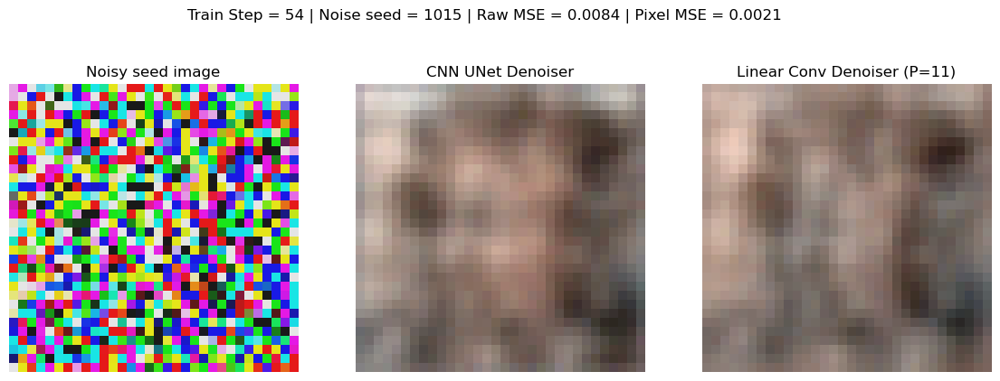

MSE of conv: 0.0071447379887104034


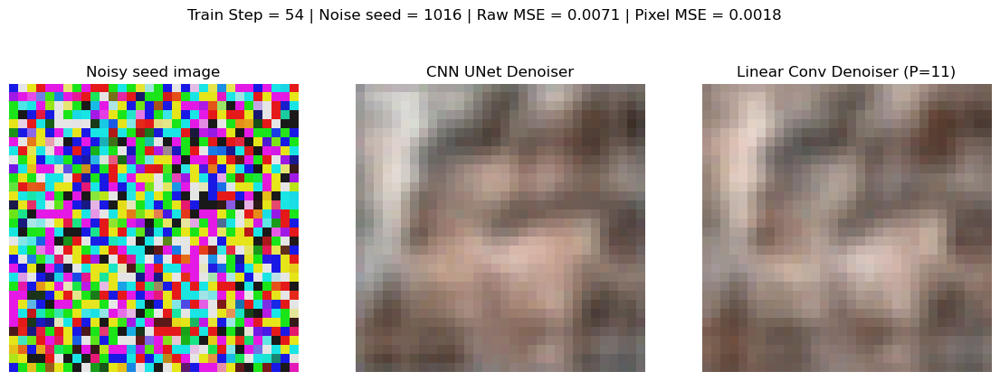

MSE of conv: 0.006998786237090826


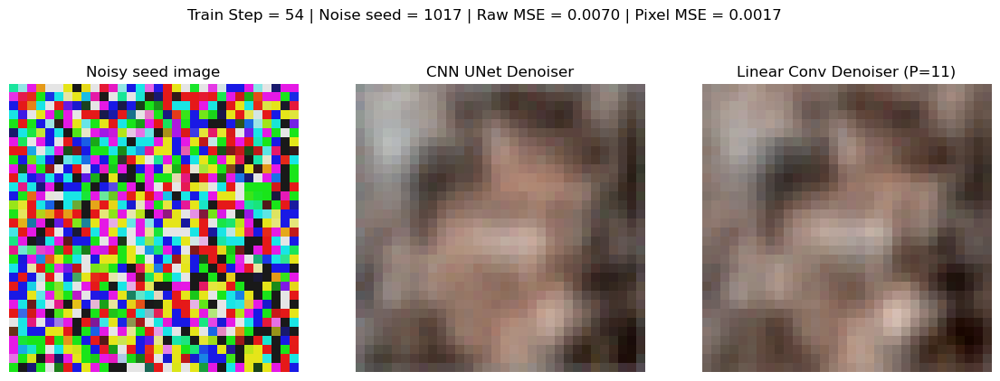

MSE of conv: 0.010150618851184845


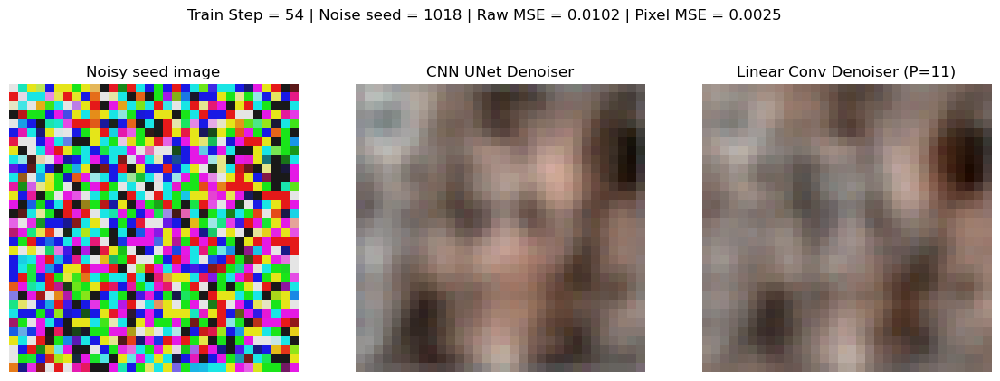

MSE of conv: 0.008271899074316025


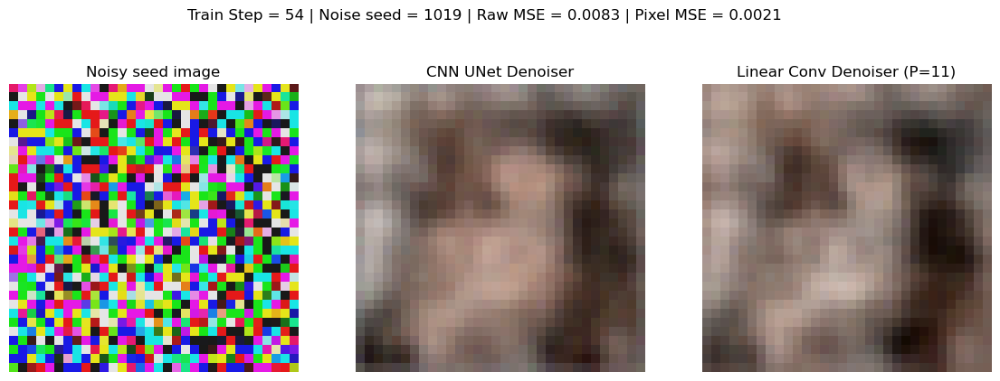

In [ ]:
P = 11
# conv_closedform, mse_closedform, mse_conv = fit_linear_denoiser(
#         x_probe, denoised, 
#         kernel_size=P, lambda_reg=1e-3, device=device
# )
conv_closedform = conv_closedform.to(device)
for noise_seed in range(1015, 1020):
    noise_z = torch.randn((1,3,32,32), 
            generator=torch.Generator().manual_seed(noise_seed))
    noise_level = 5.0
    x_probe = ref_x + noise_level * noise_z
    t_sigma = noise_level * torch.ones(1, device=device)
    with torch.no_grad():
        denoised = CNN_precd(x_probe.to(device), t_sigma)
        denoised_conv = conv_closedform(x_probe.cuda())
    # mse 
    MSE_conv = ((denoised_conv - denoised)**2).mean()
    print(f"MSE of conv: {MSE_conv.item()}")
    # plot and compare the two images
    denoiser_img = (denoised.cpu().squeeze().permute(1, 2, 0).clamp(-1, 1) + 1) / 2
    denoiser_img_conv = (denoised_conv.detach().cpu().squeeze().permute(1, 2, 0).clamp(-1, 1) + 1) / 2
    MSE_img = ((denoiser_img - denoiser_img_conv)**2).mean()
    plt.figure(figsize=(14, 5))
    plt.subplot(1, 3, 1)
    plt.imshow(x_probe.cpu().squeeze().permute(1, 2, 0).clamp(-1, 1) / noise_level / 0.5 + 0.5)
    plt.title(f"Noisy seed image")
    plt.axis('off')
    plt.subplot(1, 3, 2)
    plt.imshow(denoiser_img)
    plt.title(f"CNN UNet Denoiser")
    plt.axis('off')
    plt.subplot(1, 3, 3)
    plt.imshow(denoiser_img_conv)
    plt.title(f"Linear Conv Denoiser (P={P})")
    plt.axis('off')
    plt.suptitle(f"Train Step = {step} | Noise seed = {noise_seed} | Raw MSE = {MSE_conv.item():.4f} | Pixel MSE = {MSE_img.item():.4f}")
    plt.show()

In [ ]:
step = ckpt_step_list[35]#ckpt_step_list[50]# ckpt_step_list[20]
CNN_precd.load_state_dict(torch.load(join(ckptdir, f"model_epoch_{step:06d}.pth")))
CNN_precd = CNN_precd.to(device).eval()
CNN_precd.requires_grad_(False)
noise_seed = 42
noise_z = torch.randn((30, 3, 32, 32), 
        generator=torch.Generator().manual_seed(noise_seed))
noise_level = 5.0
x_probe = ref_x + noise_level * noise_z
t_sigma = noise_level * torch.ones(noise_z.shape[0], device=device)
denoised = CNN_precd(x_probe.to(device), t_sigma)
denoised.shape

test_noise_z = torch.randn((50,3,32,32), 
        generator=torch.Generator().manual_seed(noise_seed+1))
test_x_probe = ref_x + noise_level * test_noise_z
test_t_sigma = noise_level * torch.ones(1, device=device)
test_denoised = CNN_precd(test_x_probe.to(device), test_t_sigma)
test_denoised.shape

torch.Size([50, 3, 32, 32])

In [ ]:
P = 13
conv_closedform, mse_closedform, mse_conv = fit_linear_conv_denoiser(
    x_probe=x_probe.to(device), 
    denoised=denoised.to(device), 
    kernel_size=P, 
    lambda_reg=1e-3, 
    device=device
)
eval_linear_conv_denoiser(conv_closedform, test_x_probe.cuda(), 
                          test_denoised.cuda());

MSE of OLS closed form solution: 0.007397406734526157
MSE of conv2d: 0.007397406734526157
MSE of conv2d: 0.007414013613015413


### Sweep the patch size

In [ ]:
eval_MSE_col = []
for P in [1, 3, 5, 7, 9, 11, 13, 15, 17, 33]:
    print(f"P={P}")
    conv_closedform, mse_closedform, mse_conv = fit_linear_conv_denoiser(
        x_probe, denoised, 
        kernel_size=P, lambda_reg=1e-3, device=device
    )
    print("Eval: ", end="")
    eval_MSE = eval_linear_conv_denoiser(conv_closedform, test_x_probe.cuda(), 
                          test_denoised.cuda());
    eval_MSE_col.append({"P": P, "MSE": eval_MSE.item(), "mse_closedform": mse_closedform.item(), "mse_conv": mse_conv.item()})

eval_MSE_col = pd.DataFrame(eval_MSE_col)
eval_MSE_col


P=1
MSE of OLS closed form solution: 0.06734731793403625
MSE of conv2d: 0.06734731793403625
Eval: MSE of conv2d: 0.06938252598047256
P=3
MSE of OLS closed form solution: 0.03220609202980995
MSE of conv2d: 0.03220609575510025
Eval: MSE of conv2d: 0.032742731273174286
P=5
MSE of OLS closed form solution: 0.01591438613831997
MSE of conv2d: 0.01591438427567482
Eval: MSE of conv2d: 0.015950728207826614
P=7
MSE of OLS closed form solution: 0.010657742619514465
MSE of conv2d: 0.01065774168819189
Eval: MSE of conv2d: 0.010482119396328926
P=9
MSE of OLS closed form solution: 0.008845088072121143
MSE of conv2d: 0.008845088072121143
Eval: MSE of conv2d: 0.008657806552946568
P=11
MSE of OLS closed form solution: 0.007932531647384167
MSE of conv2d: 0.007932531647384167
Eval: MSE of conv2d: 0.007821700535714626
P=13
MSE of OLS closed form solution: 0.007397406734526157
MSE of conv2d: 0.007397406734526157
Eval: MSE of conv2d: 0.007414013613015413
P=15
MSE of OLS closed form solution: 0.00700586801394

,P,MSE,mse_closedform,mse_conv
0,1,0.069383,0.067347,0.067347
1,3,0.032743,0.032206,0.032206
2,5,0.015951,0.015914,0.015914
3,7,0.010482,0.010658,0.010658
4,9,0.008658,0.008845,0.008845
5,11,0.007822,0.007933,0.007933
6,13,0.007414,0.007397,0.007397
7,15,0.007239,0.007006,0.007006
8,17,0.007129,0.006729,0.006729
9,33,0.006588,0.005343,0.005343


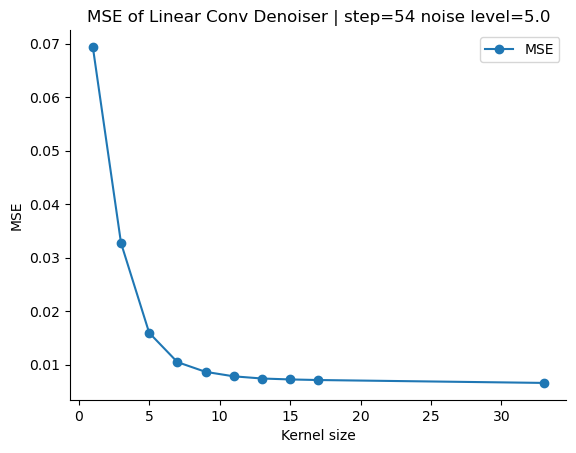

In [ ]:
eval_MSE_col.plot(x="P", y="MSE", kind="line", marker="o")
plt.ylabel("MSE")
plt.xlabel("Kernel size")
plt.title(f"MSE of Linear Conv Denoiser | step={step} noise level={noise_level}")
plt.show()

### Mass compute

In [ ]:
eval_MSE_col = []
step = ckpt_step_list[-1]#ckpt_step_list[50]# ckpt_step_list[20]
for step in tqdm(ckpt_step_list[::10]):
    CNN_precd.load_state_dict(torch.load(join(ckptdir, f"model_epoch_{step:06d}.pth")))
    CNN_precd = CNN_precd.to(device).eval()
    CNN_precd.requires_grad_(False)
    noise_seed = 111
    noise_z = torch.randn((50, 3, 32, 32), device=device, 
            generator=torch.Generator(device=device).manual_seed(noise_seed))
    
    test_noise_z = torch.randn((50,3,32,32), device=device, 
            generator=torch.Generator(device=device).manual_seed(noise_seed+1))
    noise_level = 5.0
    for noise_level in [0.001, 0.01, 0.1, 0.5, 1.0, 5.0, 10.0, 50.0, 100.0]:
        x_probe = ref_x.to(device) + noise_level * noise_z
        t_sigma = noise_level * torch.ones(noise_z.shape[0], device=device)
        denoised = CNN_precd(x_probe.to(device), t_sigma)
        test_x_probe = ref_x.to(device) + noise_level * test_noise_z
        test_t_sigma = noise_level * torch.ones(1, device=device)
        test_denoised = CNN_precd(test_x_probe.to(device), test_t_sigma)
        # Example usage:
        for P in [1, 3, 5, 7, 9, 11, 13, 15, 17, 33]:
            print(f"P={P}")
            conv_closedform, mse_closedform, mse_conv = fit_linear_conv_denoiser(
                x_probe, denoised, 
                kernel_size=P, lambda_reg=1e-3, device=device
            )
            # print("Eval: ", end="")
            eval_MSE = eval_linear_conv_denoiser(conv_closedform, test_x_probe.cuda(), 
                                test_denoised.cuda());
            eval_MSE_col.append({"step": step, "noise_level": noise_level, "noise_seed": noise_seed, 
                                "patch_size": P, "MSE_eval": eval_MSE.item(), "mse_train": mse_closedform.item(), "mse_conv": mse_conv.item()})

eval_MSE_df = pd.DataFrame(eval_MSE_col)
eval_MSE_df

  0%|          | 0/18 [00:00<?, ?it/s]

P=1
MSE of OLS closed form solution: 9.215354174196833e-11
MSE of conv2d: 9.21538401144062e-11
MSE of conv2d: 9.217070856548659e-11
P=3
MSE of OLS closed form solution: 2.0508703069133105e-10
MSE of conv2d: 2.0508701681354324e-10
MSE of conv2d: 2.0531754074681885e-10
P=5
MSE of OLS closed form solution: 6.106256611460026e-10
MSE of conv2d: 6.106256611460026e-10
MSE of conv2d: 6.096910754038731e-10
P=7
MSE of OLS closed form solution: 1.6360275356674947e-09
MSE of conv2d: 1.6360275356674947e-09
MSE of conv2d: 1.6403834957046115e-09
P=9
MSE of OLS closed form solution: 2.165398083064929e-09
MSE of conv2d: 2.165398083064929e-09
MSE of conv2d: 2.1710746533898373e-09
P=11
MSE of OLS closed form solution: 4.132592046346417e-09
MSE of conv2d: 4.132592490435627e-09
MSE of conv2d: 4.1380023851900205e-09
P=13
MSE of OLS closed form solution: 4.05388878021995e-09
MSE of conv2d: 4.05388878021995e-09
MSE of conv2d: 4.073738235632618e-09
P=15
MSE of OLS closed form solution: 7.335277985021094e-08
MS

,step,noise_level,noise_seed,patch_size,MSE_eval,mse_train,mse_conv
0,0,0.001,111,1,9.217071e-11,9.215354e-11,9.215384e-11
1,0,0.001,111,3,2.053175e-10,2.050870e-10,2.050870e-10
2,0,0.001,111,5,6.096911e-10,6.106257e-10,6.106257e-10
3,0,0.001,111,7,1.640383e-09,1.636028e-09,1.636028e-09
4,0,0.001,111,9,2.171075e-09,2.165398e-09,2.165398e-09
...,...,...,...,...,...,...,...
1615,249999,100.000,111,11,2.266911e-02,2.266265e-02,2.266264e-02
1616,249999,100.000,111,13,2.242604e-02,2.211360e-02,2.211360e-02
1617,249999,100.000,111,15,2.226596e-02,2.164475e-02,2.164475e-02
1618,249999,100.000,111,17,2.212928e-02,2.117989e-02,2.117988e-02


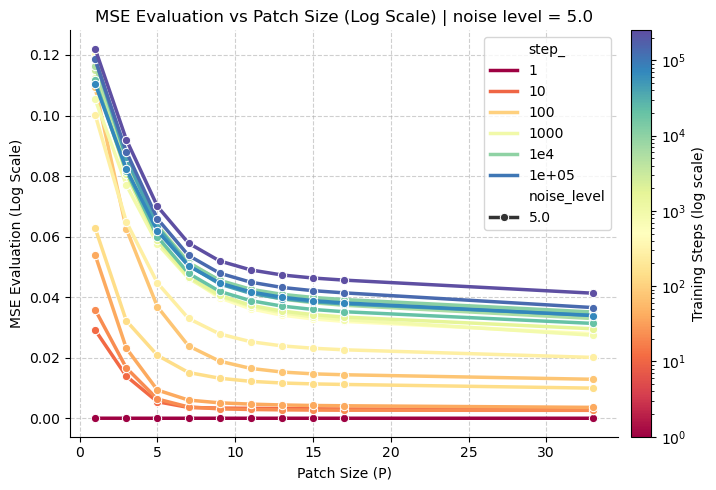

In [ ]:
from matplotlib.colors import LogNorm
eval_MSE_df["step_"] = eval_MSE_df["step"] + 1

norm = LogNorm(
    vmin=eval_MSE_df['step_'].min(),
    vmax=eval_MSE_df['step_'].max()
)
noise_level = 5.0   
fig, ax = plt.subplots(figsize=(7.5, 5))
sns.lineplot(data=eval_MSE_df.query("noise_level == @noise_level"), x="patch_size", y="MSE_eval", hue="step_", hue_norm=norm,
             palette="Spectral", style="noise_level", linewidth=2.5, markers=True, ax=ax)
# plt.yscale('log')
# add a colorbar to show the mapping from log(step) to color
sm = plt.cm.ScalarMappable(cmap="Spectral", norm=norm)
sm.set_array([])  # fake up the array
cbar = plt.colorbar(sm, ax=ax, pad=0.02)
cbar.set_label("Training Steps (log scale)")
plt.title(f"MSE Evaluation vs Patch Size (Log Scale) | noise level = {noise_level}")
plt.xlabel("Patch Size (P)")
plt.ylabel(f"MSE Evaluation (Log Scale)")
plt.grid(True, which="both", linestyle="--", alpha=0.6)
# plt.legend(title="Training Steps", bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()

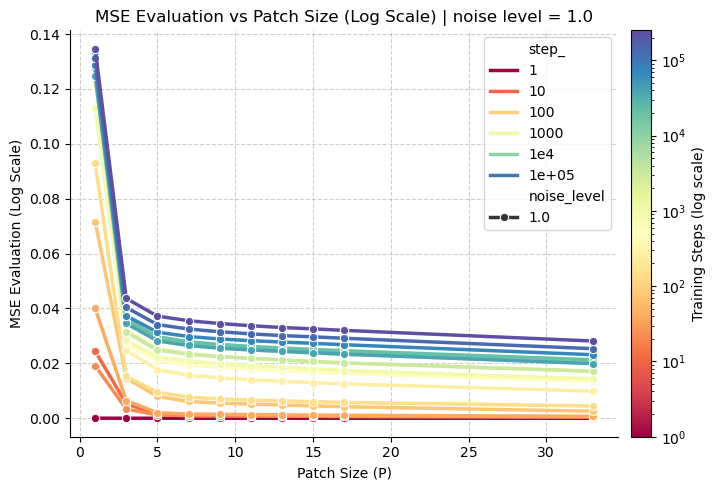

In [ ]:
from matplotlib.colors import LogNorm
eval_MSE_df["step_"] = eval_MSE_df["step"] + 1

norm = LogNorm(
    vmin=eval_MSE_df['step_'].min(),
    vmax=eval_MSE_df['step_'].max()
)
noise_level = 1.0   
fig, ax = plt.subplots(figsize=(7.5, 5))
sns.lineplot(data=eval_MSE_df.query("noise_level == @noise_level"), x="patch_size", y="MSE_eval", hue="step_", hue_norm=norm,
             palette="Spectral", style="noise_level", linewidth=2.5, markers=True, ax=ax)
# plt.yscale('log')
# add a colorbar to show the mapping from log(step) to color
sm = plt.cm.ScalarMappable(cmap="Spectral", norm=norm)
sm.set_array([])  # fake up the array
cbar = plt.colorbar(sm, ax=ax, pad=0.02)
cbar.set_label("Training Steps (log scale)")
plt.title(f"MSE Evaluation vs Patch Size (Log Scale) | noise level = {noise_level}")
plt.xlabel("Patch Size (P)")
plt.ylabel(f"MSE Evaluation (Log Scale)")
plt.grid(True, which="both", linestyle="--", alpha=0.6)
# plt.legend(title="Training Steps", bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()

In [ ]:
figdir = join(savedir, "Fig_linear_conv_denoiser")
os.makedirs(figdir, exist_ok=True)

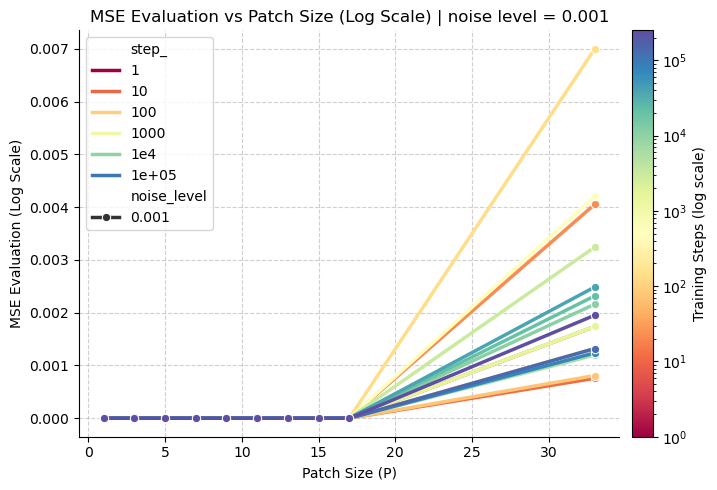

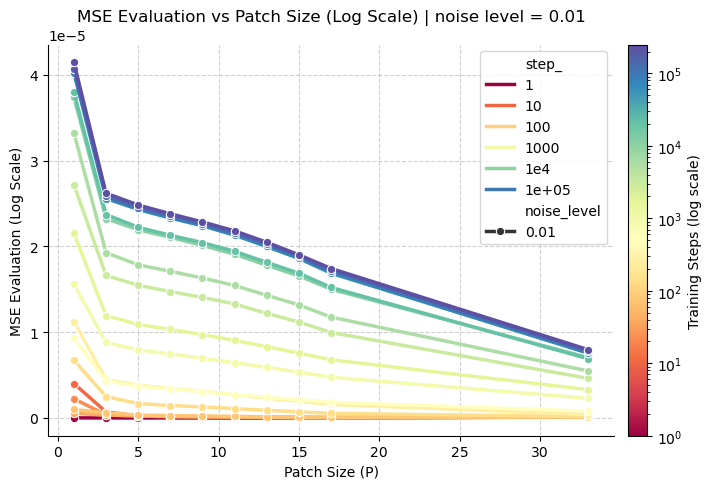

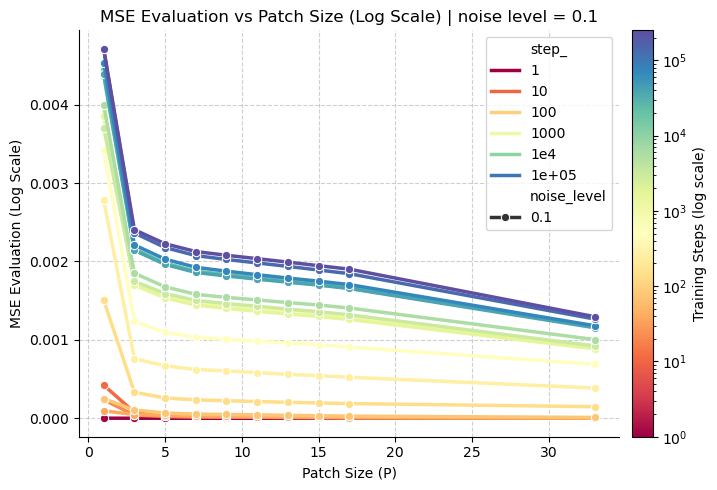

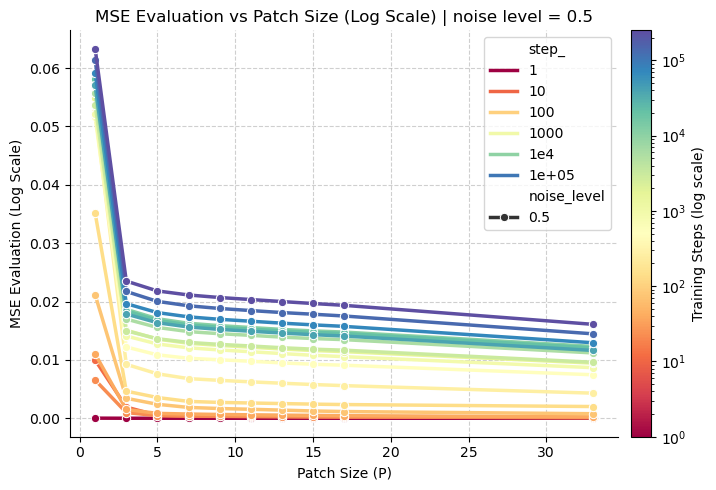

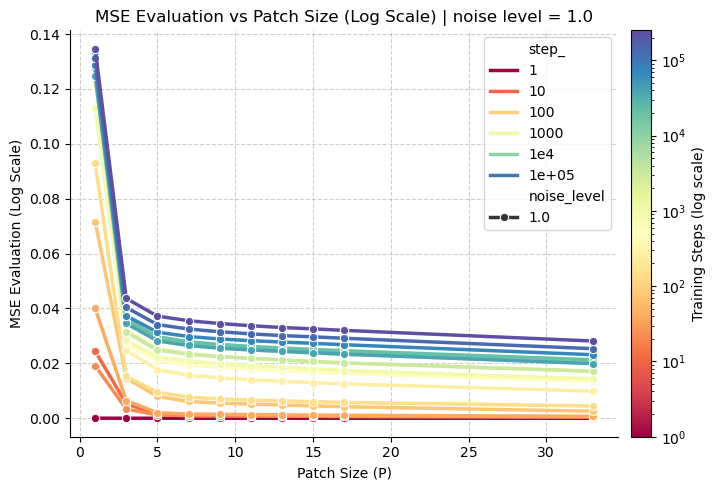

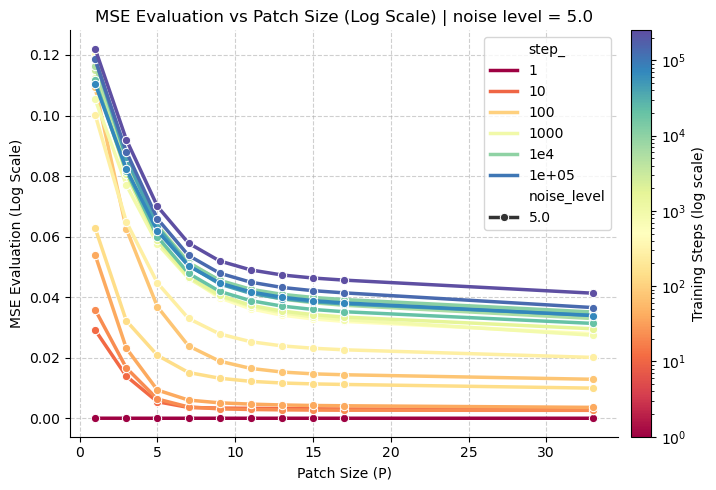

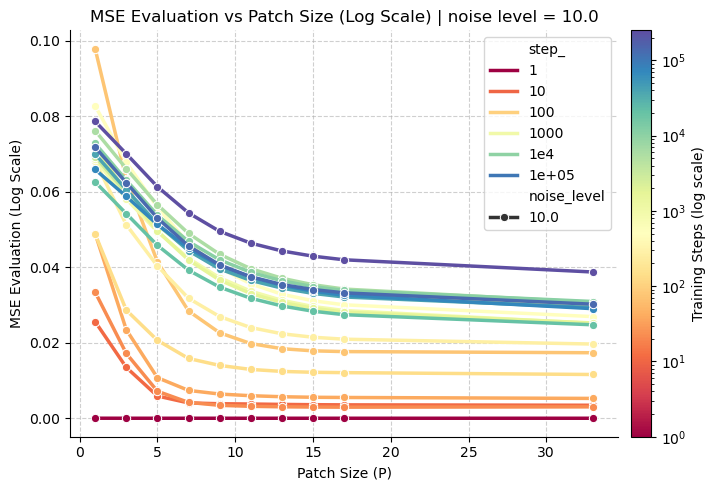

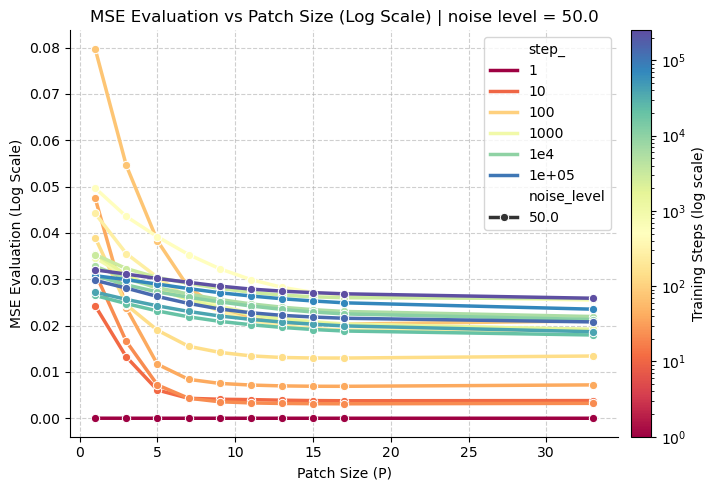

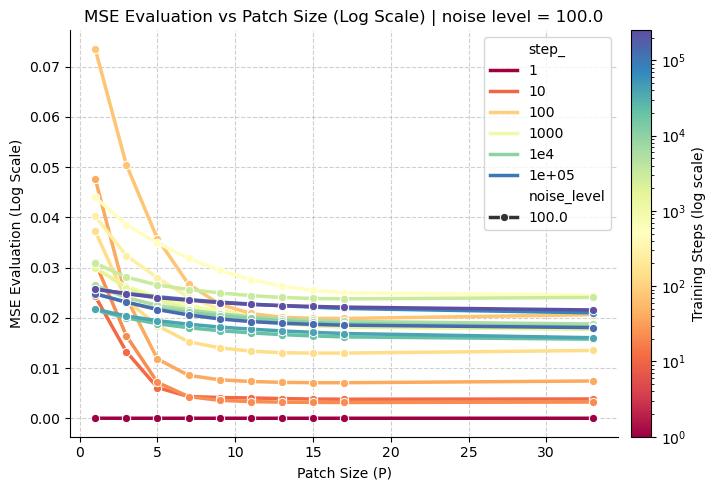

In [ ]:
from matplotlib.colors import LogNorm
eval_MSE_df["step_"] = eval_MSE_df["step"] + 1

norm = LogNorm(
    vmin=eval_MSE_df['step_'].min(),
    vmax=eval_MSE_df['step_'].max()
)
for noise_level in [0.001, 0.01, 0.1, 0.5, 1.0, 5.0, 10.0, 50.0, 100.0]:
    fig, ax = plt.subplots(figsize=(7.5, 5))
    sns.lineplot(data=eval_MSE_df.query("noise_level == @noise_level"), x="patch_size", y="MSE_eval", hue="step_", hue_norm=norm,
                palette="Spectral", style="noise_level", linewidth=2.5, markers=True, ax=ax)
    # plt.yscale('log')
    # add a colorbar to show the mapping from log(step) to color
    sm = plt.cm.ScalarMappable(cmap="Spectral", norm=norm)
    sm.set_array([])  # fake up the array
    cbar = plt.colorbar(sm, ax=ax, pad=0.02)
    cbar.set_label("Training Steps (log scale)")
    plt.title(f"MSE Evaluation vs Patch Size (Log Scale) | noise level = {noise_level}")
    plt.xlabel("Patch Size (P)")
    plt.ylabel(f"MSE Evaluation (Log Scale)")
    plt.grid(True, which="both", linestyle="--", alpha=0.6)
    # plt.legend(title="Training Steps", bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.tight_layout()
    saveallforms(figdir, f"denoiser_mse_eval_vs_linear_conv_patch_size_noise_level_{noise_level}", figh=fig)
    plt.show()

### Compare Gaussian Covariance predictor and Denoiser and Extract patches from the original image set and compute covariance

In [ ]:
data_Xtsr.shape

torch.Size([70000, 3, 32, 32])

In [ ]:
from einops import rearrange, reduce

In [ ]:
step = ckpt_step_list[45]#ckpt_step_list[50]# ckpt_step_list[20]
CNN_precd.load_state_dict(torch.load(join(ckptdir, f"model_epoch_{step:06d}.pth")))
CNN_precd = CNN_precd.to(device).eval()
CNN_precd.requires_grad_(False)
noise_seed = 42
noise_z = torch.randn((100, 3, 32, 32), 
        generator=torch.Generator().manual_seed(noise_seed))
noise_level = 1.0
x_probe = ref_x + noise_level * noise_z
t_sigma = noise_level * torch.ones(noise_z.shape[0], device=device)
denoised = CNN_precd(x_probe.to(device), t_sigma)
denoised.shape

test_noise_z = torch.randn((100,3,32,32), 
        generator=torch.Generator().manual_seed(noise_seed+1))
test_x_probe = ref_x + noise_level * test_noise_z
test_t_sigma = noise_level * torch.ones(1, device=device)
test_denoised = CNN_precd(test_x_probe.to(device), test_t_sigma)
test_denoised.shape

torch.Size([100, 3, 32, 32])

In [ ]:
P = 15
conv_closedform, mse_closedform, mse_conv = fit_linear_conv_denoiser(
    x_probe=x_probe.to(device), 
    denoised=denoised.to(device), 
    kernel_size=P, 
    lambda_reg=1e-3, 
    device=device
)
eval_linear_conv_denoiser(conv_closedform, test_x_probe.cuda(), 
                          test_denoised.cuda());

MSE of OLS closed form solution: 0.0062464578077197075
MSE of conv2d: 0.00624645734205842
MSE of conv2d: 0.006205638404935598


In [ ]:
P = 15
X = data_Xtsr[1000:3000].cpu()
X = (X - 0.5) / 0.5
# Y = data_Xtsr[1000:3000].cpu()
C_out = X.shape[1]
C_in = X.shape[1]
# X: (N, C_in, H, W), Y: (N, C_out, H_out, W_out)
unfold = torch.nn.Unfold(kernel_size=P, padding=P//2, stride=1)
X_patches = unfold(X)
print(X_patches.shape)

torch.Size([2000, 675, 1024])


In [ ]:
n_samples, n_patch_elements, n_positions = X_patches.shape
X_patches_flatten = rearrange(X_patches, "n_sample n_element n_position -> (n_sample n_position) n_element")
patch_mean = X_patches_flatten.mean(dim=0)
patch_cov = torch.cov(X_patches_flatten.T)  # Transpose to get n_element by n_element covariance matrix

In [ ]:
sigma = noise_level
eye_mat = torch.eye(patch_cov.shape[0])
denoiser_jacobian = patch_cov @ torch.linalg.inv(patch_cov + eye_mat * sigma ** 2)
denoiser_bias = (eye_mat - denoiser_jacobian) @ patch_mean

In [ ]:
W_center = denoiser_jacobian.view(C_in, P, P, C_in, P, P)[:, P//2, P//2, :, :, :]
b_center = denoiser_bias.view(C_in, P, P)[:, P//2, P//2]
print(W_center.shape)
print(b_center.shape)

torch.Size([3, 3, 15, 15])
torch.Size([3])


In [ ]:
denoiser_bias.shape

torch.Size([675])

In [ ]:
b_center

tensor([ 0.0129, -0.0092, -0.0215])

In [ ]:
conv_closedform.weight.data.shape

torch.Size([3, 3, 15, 15])

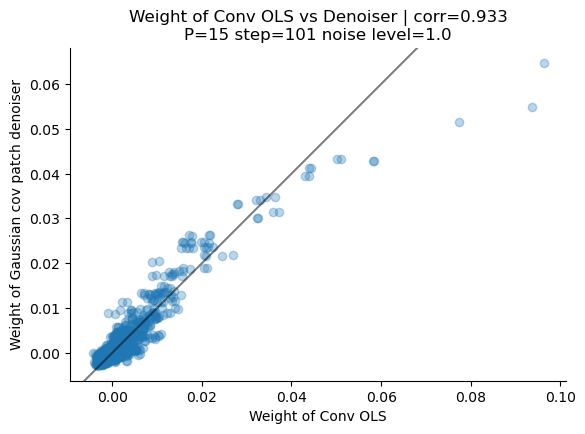

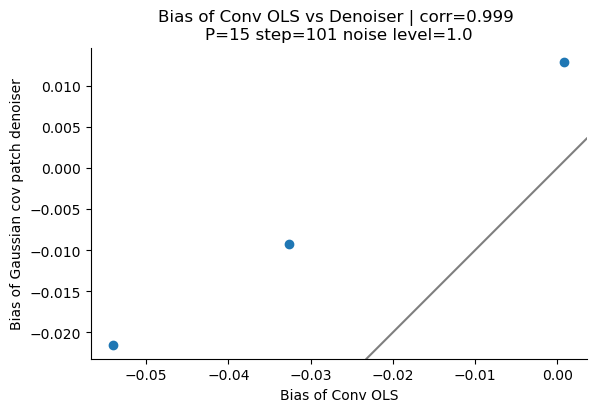

In [ ]:
# correlate the center of the kernel with the weight of the conv model
weight_conv_OLS = conv_closedform.weight.data.detach().cpu()
weight_cov_inv_denoiser = W_center.cpu()
# perform corrcoef
corrcoef = torch.corrcoef(torch.stack([weight_conv_OLS.flatten(), weight_cov_inv_denoiser.flatten()]))
corr = corrcoef[0, 1]
plt.plot(weight_conv_OLS.flatten(), weight_cov_inv_denoiser.flatten(), "o", alpha=0.3)
plt.axline((0, 0), slope=1, color="k", alpha=0.5)
plt.axis("image")
plt.xlabel("Weight of Conv OLS")
plt.ylabel("Weight of Gaussian cov patch denoiser")
plt.title(f"Weight of Conv OLS vs Denoiser | corr={corr:.3f}\nP={P} step={step} noise level={noise_level}")
plt.show()

bias_conv_OLS = conv_closedform.bias.data.detach().cpu()
bias_center = b_center.view(C_in)
corr = torch.corrcoef(torch.stack([bias_conv_OLS, bias_center]))[0, 1]  
plt.plot(bias_conv_OLS, bias_center, "o")
plt.axline((0, 0), slope=1, color="k", alpha=0.5)
plt.axis("image")
plt.xlabel("Bias of Conv OLS")
plt.ylabel("Bias of Gaussian cov patch denoiser")
plt.title(f"Bias of Conv OLS vs Denoiser | corr={corr:.3f} \nP={P} step={step} noise level={noise_level}")
plt.show()

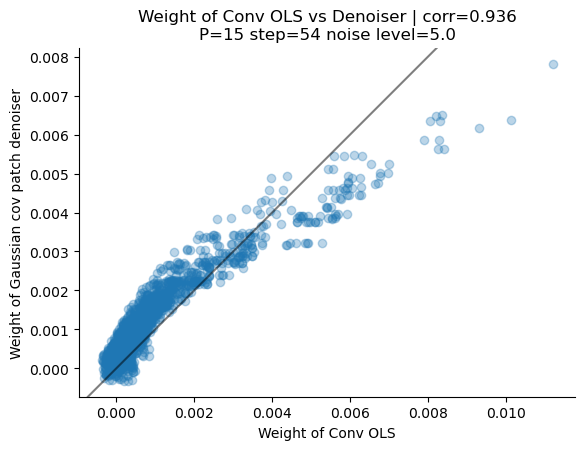

In [ ]:
# correlate the center of the kernel with the weight of the conv model
weight_conv_OLS = conv_closedform.weight.data.detach().cpu()
weight_cov_inv_denoiser = W_center.cpu()
# perform corrcoef
corrcoef = torch.corrcoef(torch.stack([weight_conv_OLS.flatten(), weight_cov_inv_denoiser.flatten()]))
corr = corrcoef[0, 1]
plt.plot(weight_conv_OLS.flatten(), weight_cov_inv_denoiser.flatten(), "o", alpha=0.3)
plt.axline((0, 0), slope=1, color="k", alpha=0.5)
plt.axis("image")
plt.xlabel("Weight of Conv OLS")
plt.ylabel("Weight of Gaussian cov patch denoiser")
plt.title(f"Weight of Conv OLS vs Denoiser | corr={corr:.3f}\nP={P} step={step} noise level={noise_level}")
plt.show()

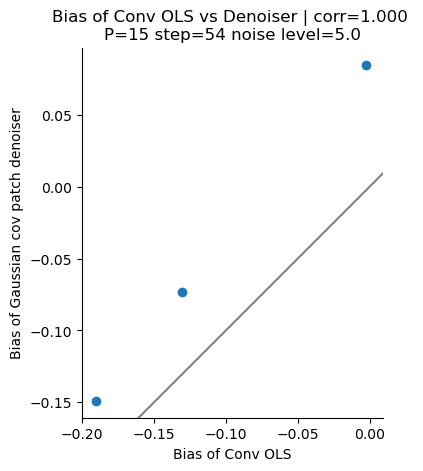

In [ ]:
bias_conv_OLS = conv_closedform.bias.data.detach().cpu()
bias_center = b_center.view(C_in)
corr = torch.corrcoef(torch.stack([bias_conv_OLS, bias_center]))[0, 1]  

plt.plot(bias_conv_OLS, bias_center, "o")
plt.axline((0, 0), slope=1, color="k", alpha=0.5)
plt.axis("image")
plt.xlabel("Bias of Conv OLS")
plt.ylabel("Bias of Gaussian cov patch denoiser")
plt.title(f"Bias of Conv OLS vs Denoiser | corr={corr:.3f} \nP={P} step={step} noise level={noise_level}")
plt.show()


In [ ]:
weight_cov_inv_denoiser

tensor([[[[5.0835e-04, 5.6071e-04, 6.3347e-04,  ..., 6.2813e-04,
           5.5116e-04, 4.9299e-04],
          [5.0377e-04, 5.6495e-04, 6.4922e-04,  ..., 6.4378e-04,
           5.5518e-04, 4.8878e-04],
          [5.0452e-04, 5.7734e-04, 6.7798e-04,  ..., 6.7157e-04,
           5.6664e-04, 4.8922e-04],
          ...,
          [4.3254e-04, 5.0900e-04, 6.1348e-04,  ..., 6.0509e-04,
           4.9746e-04, 4.1760e-04],
          [3.9291e-04, 4.5859e-04, 5.4710e-04,  ..., 5.3786e-04,
           4.4623e-04, 3.7775e-04],
          [3.6561e-04, 4.2302e-04, 4.9999e-04,  ..., 4.9071e-04,
           4.1049e-04, 3.5097e-04]],

         [[3.7998e-04, 4.1186e-04, 4.6339e-04,  ..., 4.6574e-04,
           4.1038e-04, 3.7350e-04],
          [3.7018e-04, 4.0888e-04, 4.6911e-04,  ..., 4.7076e-04,
           4.0664e-04, 3.6369e-04],
          [3.6465e-04, 4.1255e-04, 4.8577e-04,  ..., 4.8643e-04,
           4.0949e-04, 3.5797e-04],
          ...,
          [3.1621e-04, 3.7108e-04, 4.5224e-04,  ..., 4.5078

In [ ]:
weight_conv_OLS

tensor([[[[ 7.5122e-04,  6.5577e-04,  6.6456e-04,  ...,  2.5286e-04,
            1.7064e-04,  1.7281e-04],
          [ 6.6563e-04,  6.1749e-04,  6.1298e-04,  ...,  1.9268e-04,
            6.4824e-05,  5.9261e-05],
          [ 6.7066e-04,  6.2349e-04,  6.4716e-04,  ...,  1.9681e-04,
            6.7197e-05,  3.3037e-05],
          ...,
          [ 3.5197e-04,  4.9920e-04,  6.6851e-04,  ...,  3.1298e-04,
            1.4844e-04,  4.1211e-05],
          [ 3.3977e-04,  4.8486e-04,  6.8754e-04,  ...,  2.3502e-04,
            7.7783e-05, -2.5087e-05],
          [ 3.9608e-04,  5.0561e-04,  6.9775e-04,  ...,  1.8754e-04,
           -2.9785e-05, -1.2755e-04]],

         [[ 4.8002e-04,  4.1147e-04,  3.7443e-04,  ...,  3.1164e-04,
            1.6532e-04,  1.7293e-05],
          [ 4.4182e-04,  3.7747e-04,  3.7746e-04,  ...,  1.8909e-04,
            2.5226e-05, -1.9409e-04],
          [ 3.9964e-04,  3.6929e-04,  4.0228e-04,  ...,  2.8226e-04,
            8.9760e-05, -1.4975e-04],
          ...,
     

## CNN UNet 64

In [157]:
exproot = "/n/holylfs06/LABS/kempner_fellow_binxuwang/Users/binxuwang/DL_Projects/DiffusionSpectralLearningCurve"
expname = "FFHQ64_UNet_CNN_EDM_4blocks_wide128_attn_saveckpt_fewsample_longtrain"
savedir = join(saveroot, expname)
ckptdir = join(savedir, "ckpts")
sample_dir = join(savedir, "samples")
linconv_dir = join(savedir, "linconv_results")
os.makedirs(linconv_dir, exist_ok=True)
config = edict(json.load(open(f"{savedir}/config.json")))
args = edict(json.load(open(f"{savedir}/args.json")))
pprint(config)
unet = create_unet_model(config)
CNN_precd = EDMCNNPrecondWrapper(unet, sigma_data=0.5, sigma_min=0.002, sigma_max=80, rho=7.0)

ckpt_step_list = find_all_ckpt_steps(ckptdir)
CNN_precd.load_state_dict(torch.load(join(ckptdir, f"model_epoch_{ckpt_step_list[-1]:06d}.pth")))

{'attn_resolutions': [8],
 'augment_dim': 0,
 'channel_mult': [1, 2, 2, 2],
 'channels': 3,
 'decoder_init_attn': True,
 'dropout': 0.0,
 'img_size': 64,
 'label_dim': 0,
 'layers_per_block': 1,
 'model_channels': 128}
total number of trainable parameters in the Score Model: 28183299
total number of parameters in the Score Model: 28183299
Found 169 checkpoints in the directory, largest step is 220643


<All keys matched successfully>

Loading Image Dataset

In [12]:
import sys
sys.path.append("/n/home12/binxuwang/Github/edm")
from training.dataset import TensorDataset, ImageFolderDataset
edm_dataset_root = "/n/holylfs06/LABS/kempner_fellow_binxuwang/Users/binxuwang/Datasets/EDM_datasets/datasets"
edm_ffhq64_path = join(edm_dataset_root, "ffhq-64x64.zip")
dataset = ImageFolderDataset(edm_ffhq64_path)

In [13]:
def fetch_ref_img_tsr(dataset, ref_img_idx=188):
    """
    Fetch a reference image from the dataset and convert it to a tensor.
    """
    if isinstance(ref_img_idx, int):
        ref_x_raw = dataset[ref_img_idx][0] # 77 is a nice example
    # if it's a iterable, then it's a list of images
    elif isinstance(ref_img_idx, (list, tuple, range, np.ndarray)):
        ref_x_raw = ([dataset[i][0] for i in ref_img_idx])
        ref_x_raw = np.stack(ref_x_raw)
    else:
        raise ValueError(f"Invalid reference image index: {ref_img_idx}")
    ref_x_raw = torch.from_numpy(ref_x_raw).float() / 255.0
    ref_x = (ref_x_raw - 0.5) / 0.5
    return ref_x

ref_x = fetch_ref_img_tsr(dataset, 188)
# denoises_col_fewer = compute_denoised_images(CNN_precd, ckptdir, step2plot, ref_x, noise_z=None, noise_seed=noise_seed)
# # Call the function with the current parameters
# imgtsr_all, imggrid_all = visualize_denoising_trajectory(denoises_col_fewer, denoiserdir, ref_img_idx, noise_seed, )
# step2plot = ckpt_step_list[::2]
# denoises_col = compute_denoised_images(CNN_precd, ckptdir, step2plot, ref_x, noise_z=None, noise_seed=noise_seed)

In [14]:
def visualize_denoiser_comparison(ref_xs, CNN_precd, conv_closedform, noise_seeds, noise_level=5.0, P=15, device='cuda'):
    """
    Visualize and compare CNN UNet denoiser with Linear Conv denoiser.
    
    Args:
        ref_x: Reference images
        CNN_precd: CNN UNet denoiser model
        conv_closedform: Linear Conv denoiser model
        noise_seeds: List of noise seeds to use
        noise_level: Noise level to add
        P: Patch size used for linear conv denoiser
        device: Device to run computations on
    """
    conv_closedform = conv_closedform.to(device)
    if ref_xs.ndim == 3:
        ref_xs = ref_xs.unsqueeze(0)
        ref_xs = ref_xs.expand(len(noise_seeds), *ref_xs.shape[1:])
    if ref_xs.ndim == 4 and ref_xs.shape[0] == 1:
        ref_xs = ref_xs.expand(len(noise_seeds), *ref_xs.shape[1:])
    for ref_x, noise_seed in zip(ref_xs, noise_seeds):
        # Generate noisy image
        noise_z = torch.randn((1, 3, 64, 64), 
                generator=torch.Generator().manual_seed(noise_seed))
        x_probe = ref_x + noise_level * noise_z
        t_sigma = noise_level * torch.ones(1, device=device)
        
        # Denoise with both models
        with torch.no_grad():
            denoised = CNN_precd(x_probe.to(device), t_sigma)
            denoised_conv = conv_closedform(x_probe.to(device))
        
        # Calculate MSE between denoised outputs
        MSE_conv = ((denoised_conv - denoised)**2).mean()
        
        # Convert to displayable images
        denoiser_img = (denoised.cpu().squeeze().permute(1, 2, 0).clamp(-1, 1) + 1) / 2
        denoiser_img_conv = (denoised_conv.detach().cpu().squeeze().permute(1, 2, 0).clamp(-1, 1) + 1) / 2
        MSE_img = ((denoiser_img - denoiser_img_conv)**2).mean()
        
        # Plot comparison
        plt.figure(figsize=(14, 5))
        plt.subplot(1, 3, 1)
        plt.imshow(x_probe.cpu().squeeze().permute(1, 2, 0).clamp(-1, 1) / noise_level / 0.5 + 0.5)
        plt.title(f"Noisy seed image")
        plt.axis('off')
        plt.subplot(1, 3, 2)
        plt.imshow(denoiser_img)
        plt.title(f"CNN UNet Denoiser")
        plt.axis('off')
        plt.subplot(1, 3, 3)
        plt.imshow(denoiser_img_conv)
        plt.title(f"Linear Conv Denoiser (P={P})")
        plt.axis('off')
        plt.suptitle(f"Train Step = {step} | noise level = {noise_level} | Noise seed = {noise_seed} | Raw MSE = {MSE_conv.item():.4f} | Pixel MSE = {MSE_img.item():.4f}")
        plt.show()


### Gaussian GMM model of patches | Linear conv VS Gaussian patch solution

In [15]:
from einops import rearrange
def patch_mean_cov(X, P, device='cuda'):
    # X = data_Xtsr[1000:3000].cpu()
    # X = (X - 0.5) / 0.5
    # Y = data_Xtsr[1000:3000].cpu()
    C_out = X.shape[1]
    C_in = X.shape[1]
    # X: (N, C_in, H, W), Y: (N, C_out, H_out, W_out)
    unfold = torch.nn.Unfold(kernel_size=P, padding=P//2, stride=1)
    X_patches = unfold(X)
    print(X_patches.shape)
    # n_samples, n_patch_elements, n_positions = X_patches.shape
    X_patches_flatten = rearrange(X_patches, "n_sample n_element n_position -> (n_sample n_position) n_element").to(device)
    patch_mean = X_patches_flatten.mean(dim=0)
    patch_cov = torch.cov(X_patches_flatten.T).to(device)  # Transpose to get n_element by n_element covariance matrix
    return patch_mean, patch_cov


def patch_Gaussian_denoiser(patch_mean, patch_cov, noise_level, P, C_in, device='cuda'):
    sigma = noise_level
    eye_mat = torch.eye(patch_cov.shape[0], device=device)
    patch_cov = patch_cov.to(device)
    patch_mean = patch_mean.to(device)
    denoiser_jacobian = patch_cov @ torch.linalg.inv(patch_cov + eye_mat * sigma ** 2)
    denoiser_bias = (eye_mat - denoiser_jacobian) @ patch_mean
    W_center = denoiser_jacobian.view(C_in, P, P, C_in, P, P)[:, P//2, P//2, :, :, :]
    b_center = denoiser_bias.view(C_in, P, P)[:, P//2, P//2]
    print(W_center.shape)
    print(b_center.shape)
    return denoiser_jacobian, denoiser_bias, W_center, b_center


def compute_patch_Gaussian_denoiser(data_Xtsr, P, noise_level, device='cuda'):
    C_in = data_Xtsr.shape[1]
    print("Computing patch mean and covariance")
    patch_mean, patch_cov = patch_mean_cov(data_Xtsr, P, device="cpu")
    print("Computing patch Gaussian denoiser")
    denoiser_jacobian, denoiser_bias, W_center, b_center = patch_Gaussian_denoiser(patch_mean, patch_cov, noise_level, P, C_in, device=device)
    return denoiser_jacobian, denoiser_bias, W_center, b_center


In [17]:
torch.cuda.empty_cache()

In [18]:
Xtsr64_1000 = fetch_ref_img_tsr(dataset, range(1000))
P = 15
noise_level = 5.0
device = "cpu"

X = Xtsr64_1000
C_out = X.shape[1]
C_in = X.shape[1]
# X: (N, C_in, H, W), Y: (N, C_out, H_out, W_out)
unfold = torch.nn.Unfold(kernel_size=P, padding=P//2, stride=1)
X_patches = unfold(X)
print(X_patches.shape)
# n_samples, n_patch_elements, n_positions = X_patches.shape
X_patches_flatten = rearrange(X_patches, "n_sample n_element n_position -> (n_sample n_position) n_element").to(device)
patch_mean = X_patches_flatten.mean(dim=0)
patch_cov = torch.cov(X_patches_flatten.T).to(device)  # Transpose to get n_element by n_element covariance matrix
# denoiser_jacobian, denoiser_bias, W_center, b_center = compute_patch_Gaussian_denoiser(Xtsr64_1000, P, noise_level, device='cpu')
train_patche_bank = X_patches_flatten.to(torch.float16).cuda()


torch.Size([1000, 675, 4096])


### Implement naive Patch NN decoding

In [ ]:
from tqdm import trange, tqdm

In [126]:
patchnorm = (train_patche_bank**2).sum(dim=1)
patch_center_pixel = train_patche_bank.reshape(train_patche_bank.shape[0], C_in, P, P)[:, :, P//2, P//2]

In [101]:
# get a new image and patchify it
noise_level = 0.5#1.25
ref_x = fetch_ref_img_tsr(dataset, range(50002, 50003))
x_probe = ref_x + noise_level * torch.randn(ref_x.shape, device=device)
x_probe_patches = unfold(x_probe)
print(x_probe_patches.shape)
x_probe_patches_flatten = x_probe_patches.cuda().to(torch.float16)
# x_probe_patches_flatten = rearrange(x_probe_patches, "n_sample n_element n_position -> (n_sample n_position) n_element").cuda().to(torch.float16)
# Perform K-means clustering on the patches

torch.Size([1, 675, 4096])


In [103]:
noise_level

0.5

### Demo of DeltaMixture patch denoiser

In [119]:
torch.cuda.empty_cache()
B = 32
probe_patch_num = x_probe_patches_flatten.shape[-1]
patch_recon_list = []
for csr in trange(0, probe_patch_num, B):
    # attn_score = torch.softmax((X_patches_fp16 @ x_probe_patches_flatten[0][:, csr:csr+B] - \
    #                             2 * patchnorm[:, None]) / noise_level ** 2, dim=0)#.cpu()
    # patch_recon = patch_center_pixel.T @ attn_score
    # del attn_score
    patch_recon = patch_center_pixel.T @ torch.softmax((train_patche_bank @ x_probe_patches_flatten[0][:, csr:csr+B] - \
                                patchnorm[:, None] / 2) / noise_level ** 2, dim=0)#.cpu()
    torch.cuda.empty_cache()
    patch_recon_list.append(patch_recon.cpu())
patch_recon_all = torch.cat(patch_recon_list, dim=1)
denoised_nearest = patch_recon_all.reshape(3, 64, 64)

100%|██████████| 128/128 [00:39<00:00,  3.24it/s]


In [ ]:
torch.cuda.empty_cache()
B = 32
probe_patch_num = x_probe_patches_flatten.shape[-1]
patch_recon_list = []
for csr in trange(0, probe_patch_num, B):
    # attn_score = torch.softmax((X_patches_fp16 @ x_probe_patches_flatten[0][:, csr:csr+B] - \
    #                             2 * patchnorm[:, None]) / noise_level ** 2, dim=0)#.cpu()
    # patch_recon = patch_center_pixel.T @ attn_score
    # del attn_score
    # Calculate similarity scores
    # similarity_scores = (X_patches_fp16 @ x_probe_patches_flatten[0][:, csr:csr+B] - 2 * patchnorm[:, None]) / noise_level ** 2
    # Get indices of maximum similarity for each patch
    max_indices = torch.argmax((train_patche_bank @ x_probe_patches_flatten[0][:, csr:csr+B] - patchnorm[:, None] / 2) / noise_level ** 2, dim=0)
    # Directly index the center pixels using advanced indexing
    # This avoids creating the large one-hot matrix and is more memory efficient
    patch_recon = patch_center_pixel[max_indices].T
    torch.cuda.empty_cache()
    patch_recon_list.append(patch_recon.cpu())
patch_recon_all = torch.cat(patch_recon_list, dim=1)
denoised_nearest_hardmax = patch_recon_all.reshape(3, 64, 64)

100%|██████████| 128/128 [00:01<00:00, 68.70it/s]


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


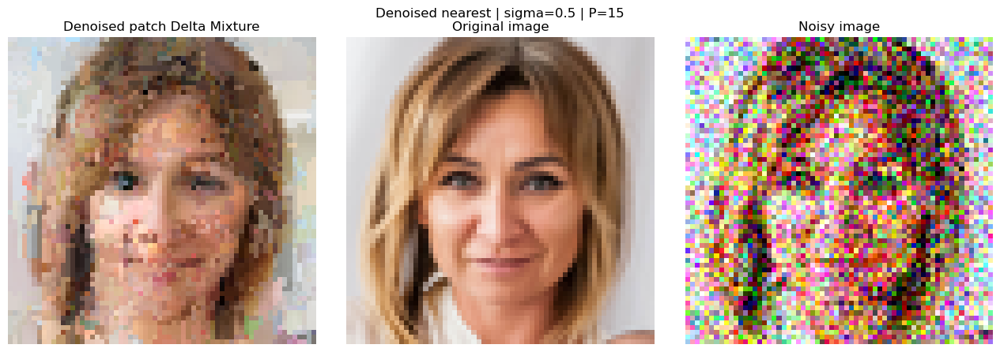

In [ ]:
plt.figure(figsize=(13, 4.5))
plt.subplot(1, 3, 1)
plt.imshow(denoised_nearest_hardmax.permute(1, 2, 0).float() * 0.5 + 0.5)
plt.axis('off')
plt.title(f"Denoised patch Delta Mixture (nearest neighbor)")
plt.subplot(1, 3, 2)
plt.imshow(ref_x[0].permute(1, 2, 0).float() * 0.5 + 0.5)
plt.axis('off')
plt.title(f"Original image")
plt.subplot(1, 3, 3)
plt.imshow(x_probe[0].permute(1, 2, 0).float() * 0.5 + 0.5)
plt.axis('off')
plt.title(f"Noisy image")
plt.suptitle(f"Denoised nearest | sigma={noise_level} | P={P}")
plt.tight_layout()
plt.show()

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


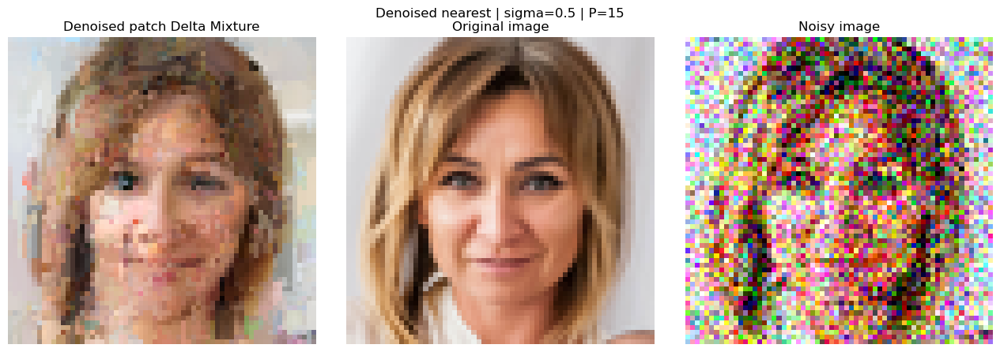

In [ ]:
plt.figure(figsize=(13, 4.5))
plt.subplot(1, 3, 1)
plt.imshow(denoised_nearest.permute(1, 2, 0).float() * 0.5 + 0.5)
plt.axis('off')
plt.title(f"Denoised patch Delta Mixture")
plt.subplot(1, 3, 2)
plt.imshow(ref_x[0].permute(1, 2, 0).float() * 0.5 + 0.5)
plt.axis('off')
plt.title(f"Original image")
plt.subplot(1, 3, 3)
plt.imshow(x_probe[0].permute(1, 2, 0).float() * 0.5 + 0.5)
plt.axis('off')
plt.title(f"Noisy image")
plt.suptitle(f"Denoised nearest | sigma={noise_level} | P={P}")
plt.tight_layout()
plt.show()

### Function version of delta mixture

In [166]:
from tqdm.auto import trange, tqdm
def delta_mixture_denoise_image(x_probe_patches_flatten, train_patche_bank, P, C_in, noise_level, patch_center_pixel=None, patchnorm=None, softmax=True, batch_size=32):
    """
    Denoise an image using either softmax or hardmax patch matching.
    
    Args:
        x_probe_patches_flatten: Flattened patches from the noisy image
        X_patches_fp16: Database of reference patches
        patch_center_pixel: Center pixels of reference patches
        patchnorm: Squared norm of reference patches
        noise_level: Noise level for weighting
        softmax: If True, use softmax weighting; if False, use hardmax (nearest neighbor)
        
    Returns:
        Denoised image tensor
    """
    torch.cuda.empty_cache()
    probe_patch_num = x_probe_patches_flatten.shape[-1]
    patch_recon_list = []
    if patchnorm is None:
        patchnorm = (train_patche_bank**2).sum(dim=1)
    if patch_center_pixel is None:
        patch_center_pixel = train_patche_bank.reshape(train_patche_bank.shape[0], C_in, P, P)[:, :, P//2, P//2]
    for csr in trange(0, probe_patch_num, batch_size):
        # Calculate similarity scores
        similarity = (train_patche_bank @ x_probe_patches_flatten[:, csr:csr+batch_size] - patchnorm[:, None] / 2) / noise_level ** 2
        if softmax:
            # Softmax weighting approach
            # attn_score = torch.softmax(similarity, dim=0)
            # patch_recon = patch_center_pixel.T @ attn_score
            patch_recon = patch_center_pixel.T @ torch.softmax(similarity, dim=0)
        else:
            # Hardmax (nearest neighbor) approach
            max_indices = torch.argmax(similarity, dim=0)
            patch_recon = patch_center_pixel[max_indices].T
        
        del similarity
        torch.cuda.empty_cache()
        patch_recon_list.append(patch_recon.cpu())
        
    patch_recon_all = torch.cat(patch_recon_list, dim=1)
    denoised_image = patch_recon_all.reshape(3, 64, 64)
    
    return denoised_image

In [167]:
def plot_denoising_comparison(denoised_results, noise_level, P, figsize=None, titles=None):
    """
    Plot a comparison of different denoising methods alongside original and noisy images.
    
    Args:
        denoised_results: List of tuples (tensor, name) containing denoised images and their method names
        ref_x: Tensor of original reference image
        x_probe: Tensor of noisy image
        noise_level: Noise level (sigma) used for denoising
        P: Patch size used for denoising
        figsize: Figure size as tuple (width, height), defaults to adaptive size based on number of plots
        titles: Optional custom titles for each subplot, defaults to method names + original/noisy
    """
    # Count total number of plots (denoised methods + original + noisy)
    n_plots = len(denoised_results)
    
    # Determine figure size if not provided
    if figsize is None:
        figsize = (n_plots * 4, 4.5)
    
    plt.figure(figsize=figsize)
    
    # Create default titles if not provided
    if titles is None:
        titles = [name for _, name in denoised_results] + ["Original image", "Noisy image"]
    
    # Plot all denoised results
    for i, (denoised_img, _) in enumerate(denoised_results):
        plt.subplot(1, n_plots, i + 1)
        # Handle both 3D and 4D tensors
        if denoised_img.ndim == 4:  # [B, C, H, W]
            img_to_plot = denoised_img[0].permute(1, 2, 0).float() * 0.5 + 0.5
        elif denoised_img.ndim == 3:  # [C, H, W]
            img_to_plot = denoised_img.permute(1, 2, 0).float() * 0.5 + 0.5
        
        plt.imshow(img_to_plot)
        plt.axis('off')
        plt.title(titles[i])
    
    plt.suptitle(f"Denoising comparison | sigma={noise_level} | P={P}")
    plt.tight_layout()
    
    return plt.gcf()

In [130]:
# Denoise using softmax weighting
denoised_nearest = delta_mixture_denoise_image(
    x_probe_patches_flatten[0], train_patche_bank, 
    P, C_in, noise_level, patch_center_pixel, patchnorm, 
    softmax=True
)

  0%|          | 0/128 [00:00<?, ?it/s]

In [132]:
# Denoise using hardmax (nearest neighbor)
denoised_nearest_hardmax = delta_mixture_denoise_image(
    x_probe_patches_flatten[0], train_patche_bank, 
    P, C_in, noise_level, patch_center_pixel, patchnorm, 
    softmax=False
)
torch.cuda.empty_cache()

  0%|          | 0/128 [00:00<?, ?it/s]

### Mass produce denoiser comparison 

In [151]:
P = 15
# noise_level = 5.0
device = "cpu"
X = fetch_ref_img_tsr(dataset, range(1000))
C_out = X.shape[1]
C_in = X.shape[1]
# X: (N, C_in, H, W), Y: (N, C_out, H_out, W_out)
unfold = torch.nn.Unfold(kernel_size=P, padding=P//2, stride=1)
X_patches = unfold(X)
print(X_patches.shape)
# n_samples, n_patch_elements, n_positions = X_patches.shape
X_patches_flatten = rearrange(X_patches, "n_sample n_element n_position -> (n_sample n_position) n_element")
# patch_mean = X_patches_flatten.mean(dim=0)
# patch_cov = torch.cov(X_patches_flatten.T).to(device)  # Transpose to get n_element by n_element covariance matrix
# denoiser_jacobian, denoiser_bias, W_center, b_center = compute_patch_Gaussian_denoiser(Xtsr64_1000, P, noise_level, device='cpu')
train_patche_bank = X_patches_flatten.to(torch.float16).cuda()
# compute common statistics 
patch_center_pixel = train_patche_bank.reshape(train_patche_bank.shape[0], C_in, P, P)[:, :, P//2, P//2]
patchnorm = (train_patche_bank**2).sum(dim=1)

torch.Size([1000, 675, 4096])


In [149]:
savedir

'/n/holylfs06/LABS/kempner_fellow_binxuwang/Users/binxuwang/DL_Projects/DiffusionSpectralLearningCurve/FFHQ64_UNet_CNN_EDM_4blocks_wide128_attn_saveckpt_fewsample_longtrain'

In [150]:
patchDMixture_savedir = os.path.join(savedir, "patchDeltaMixture_denoiser")
os.makedirs(patchDMixture_savedir, exist_ok=True)

In [152]:
patch_mean = X_patches_flatten.mean(dim=0)
patch_cov = torch.cov(X_patches_flatten.T)  # Transpose to get n_element by n_element covariance matrix

In [163]:
linconv_denoiser_dict = {}
for noise_level in [0.001, 0.01, 0.1, 0.5, 1.0, 2.0, 3.5, 5.0, 10.0, 50.0]:
    denoiser_jacobian, denoiser_bias, W_center, b_center = patch_Gaussian_denoiser(patch_mean, patch_cov, noise_level, P, C_in, device=device)
    # denoiser_jacobian, denoiser_bias, W_center, b_center = compute_patch_Gaussian_denoiser(Xtsr64_1000, P, noise_level, device='cpu')
    # build conv model
    conv_GaussianPatch = torch.nn.Conv2d(C_in, C_out, kernel_size=P, padding=P//2, stride=1)
    conv_GaussianPatch.weight.data = W_center
    conv_GaussianPatch.bias.data = b_center
    linconv_denoiser_dict[noise_level] = conv_GaussianPatch

torch.Size([3, 3, 15, 15])
torch.Size([3])
torch.Size([3, 3, 15, 15])
torch.Size([3])
torch.Size([3, 3, 15, 15])
torch.Size([3])
torch.Size([3, 3, 15, 15])
torch.Size([3])
torch.Size([3, 3, 15, 15])
torch.Size([3])
torch.Size([3, 3, 15, 15])
torch.Size([3])
torch.Size([3, 3, 15, 15])
torch.Size([3])
torch.Size([3, 3, 15, 15])
torch.Size([3])
torch.Size([3, 3, 15, 15])
torch.Size([3])
torch.Size([3, 3, 15, 15])
torch.Size([3])


In [ ]:
with torch.no_grad():
    denoised_GaussianPatch = linconv_denoiser_dict[noise_level](x_probe)
    denoised_UNet = CNN_precd(x_probe, noise_level * torch.ones(x_probe.shape[0], device=x_probe.device))

torch.Size([1, 675, 4096])


  0%|          | 0/128 [00:00<?, ?it/s]

  0%|          | 0/128 [00:00<?, ?it/s]

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
/n/home12/binxuwang/.conda/envs/torch2/lib/python3.10/site-packages/matplotlib/cm.py:494: RuntimeWarning: invalid value encountered in cast
  xx = (xx * 255).astype(np.uint8)


torch.Size([1, 675, 4096])


  0%|          | 0/128 [00:00<?, ?it/s]

  0%|          | 0/128 [00:00<?, ?it/s]

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


torch.Size([1, 675, 4096])


  0%|          | 0/128 [00:00<?, ?it/s]

  0%|          | 0/128 [00:00<?, ?it/s]

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


torch.Size([1, 675, 4096])


  0%|          | 0/128 [00:00<?, ?it/s]

  0%|          | 0/128 [00:00<?, ?it/s]

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


torch.Size([1, 675, 4096])


  0%|          | 0/128 [00:00<?, ?it/s]

  0%|          | 0/128 [00:00<?, ?it/s]

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


torch.Size([1, 675, 4096])


  0%|          | 0/128 [00:00<?, ?it/s]

  0%|          | 0/128 [00:00<?, ?it/s]

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


torch.Size([1, 675, 4096])


  0%|          | 0/128 [00:00<?, ?it/s]

  0%|          | 0/128 [00:00<?, ?it/s]

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


torch.Size([1, 675, 4096])


  0%|          | 0/128 [00:00<?, ?it/s]

  0%|          | 0/128 [00:00<?, ?it/s]

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


torch.Size([1, 675, 4096])


  0%|          | 0/128 [00:00<?, ?it/s]

  0%|          | 0/128 [00:00<?, ?it/s]

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


torch.Size([1, 675, 4096])


  0%|          | 0/128 [00:00<?, ?it/s]

  0%|          | 0/128 [00:00<?, ?it/s]

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


torch.Size([1, 675, 4096])


  0%|          | 0/128 [00:00<?, ?it/s]

  0%|          | 0/128 [00:00<?, ?it/s]

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


torch.Size([1, 675, 4096])


  0%|          | 0/128 [00:00<?, ?it/s]

  0%|          | 0/128 [00:00<?, ?it/s]

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


torch.Size([1, 675, 4096])


  0%|          | 0/128 [00:00<?, ?it/s]

  0%|          | 0/128 [00:00<?, ?it/s]

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


torch.Size([1, 675, 4096])


  0%|          | 0/128 [00:00<?, ?it/s]

  0%|          | 0/128 [00:00<?, ?it/s]

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


torch.Size([1, 675, 4096])


  0%|          | 0/128 [00:00<?, ?it/s]

  0%|          | 0/128 [00:00<?, ?it/s]

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


torch.Size([1, 675, 4096])


  0%|          | 0/128 [00:00<?, ?it/s]

  0%|          | 0/128 [00:00<?, ?it/s]

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


torch.Size([1, 675, 4096])


  0%|          | 0/128 [00:00<?, ?it/s]

  0%|          | 0/128 [00:00<?, ?it/s]

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


torch.Size([1, 675, 4096])


  0%|          | 0/128 [00:00<?, ?it/s]

  0%|          | 0/128 [00:00<?, ?it/s]

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


torch.Size([1, 675, 4096])


  0%|          | 0/128 [00:00<?, ?it/s]

  0%|          | 0/128 [00:00<?, ?it/s]

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


torch.Size([1, 675, 4096])


  0%|          | 0/128 [00:00<?, ?it/s]

  0%|          | 0/128 [00:00<?, ?it/s]

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


torch.Size([1, 675, 4096])


  0%|          | 0/128 [00:00<?, ?it/s]

  0%|          | 0/128 [00:00<?, ?it/s]

/tmp/ipykernel_1698821/1488155119.py:21: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure(figsize=figsize)
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


torch.Size([1, 675, 4096])


  0%|          | 0/128 [00:00<?, ?it/s]

  0%|          | 0/128 [00:00<?, ?it/s]

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


torch.Size([1, 675, 4096])


  0%|          | 0/128 [00:00<?, ?it/s]

  0%|          | 0/128 [00:00<?, ?it/s]

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


torch.Size([1, 675, 4096])


  0%|          | 0/128 [00:00<?, ?it/s]

  0%|          | 0/128 [00:00<?, ?it/s]

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


torch.Size([1, 675, 4096])


  0%|          | 0/128 [00:00<?, ?it/s]

  0%|          | 0/128 [00:00<?, ?it/s]

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


torch.Size([1, 675, 4096])


  0%|          | 0/128 [00:00<?, ?it/s]

  0%|          | 0/128 [00:00<?, ?it/s]

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


torch.Size([1, 675, 4096])


  0%|          | 0/128 [00:00<?, ?it/s]

  0%|          | 0/128 [00:00<?, ?it/s]

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


torch.Size([1, 675, 4096])


  0%|          | 0/128 [00:00<?, ?it/s]

  0%|          | 0/128 [00:00<?, ?it/s]

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


torch.Size([1, 675, 4096])


  0%|          | 0/128 [00:00<?, ?it/s]

  0%|          | 0/128 [00:00<?, ?it/s]

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


torch.Size([1, 675, 4096])


  0%|          | 0/128 [00:00<?, ?it/s]

  0%|          | 0/128 [00:00<?, ?it/s]

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


torch.Size([1, 675, 4096])


  0%|          | 0/128 [00:00<?, ?it/s]

  0%|          | 0/128 [00:00<?, ?it/s]

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


torch.Size([1, 675, 4096])


  0%|          | 0/128 [00:00<?, ?it/s]

  0%|          | 0/128 [00:00<?, ?it/s]

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


torch.Size([1, 675, 4096])


  0%|          | 0/128 [00:00<?, ?it/s]

  0%|          | 0/128 [00:00<?, ?it/s]

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


torch.Size([1, 675, 4096])


  0%|          | 0/128 [00:00<?, ?it/s]

  0%|          | 0/128 [00:00<?, ?it/s]

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


torch.Size([1, 675, 4096])


  0%|          | 0/128 [00:00<?, ?it/s]

  0%|          | 0/128 [00:00<?, ?it/s]

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


torch.Size([1, 675, 4096])


  0%|          | 0/128 [00:00<?, ?it/s]

  0%|          | 0/128 [00:00<?, ?it/s]

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


torch.Size([1, 675, 4096])


  0%|          | 0/128 [00:00<?, ?it/s]

  0%|          | 0/128 [00:00<?, ?it/s]

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


torch.Size([1, 675, 4096])


  0%|          | 0/128 [00:00<?, ?it/s]

  0%|          | 0/128 [00:00<?, ?it/s]

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


torch.Size([1, 675, 4096])


  0%|          | 0/128 [00:00<?, ?it/s]

  0%|          | 0/128 [00:00<?, ?it/s]

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


torch.Size([1, 675, 4096])


  0%|          | 0/128 [00:00<?, ?it/s]

  0%|          | 0/128 [00:00<?, ?it/s]

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


torch.Size([1, 675, 4096])


  0%|          | 0/128 [00:00<?, ?it/s]

  0%|          | 0/128 [00:00<?, ?it/s]

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


torch.Size([1, 675, 4096])


  0%|          | 0/128 [00:00<?, ?it/s]

  0%|          | 0/128 [00:00<?, ?it/s]

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


torch.Size([1, 675, 4096])


  0%|          | 0/128 [00:00<?, ?it/s]

  0%|          | 0/128 [00:00<?, ?it/s]

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


torch.Size([1, 675, 4096])


  0%|          | 0/128 [00:00<?, ?it/s]

  0%|          | 0/128 [00:00<?, ?it/s]

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


torch.Size([1, 675, 4096])


  0%|          | 0/128 [00:00<?, ?it/s]

  0%|          | 0/128 [00:00<?, ?it/s]

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


torch.Size([1, 675, 4096])


  0%|          | 0/128 [00:00<?, ?it/s]

  0%|          | 0/128 [00:00<?, ?it/s]

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


torch.Size([1, 675, 4096])


  0%|          | 0/128 [00:00<?, ?it/s]

  0%|          | 0/128 [00:00<?, ?it/s]

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


torch.Size([1, 675, 4096])


  0%|          | 0/128 [00:00<?, ?it/s]

  0%|          | 0/128 [00:00<?, ?it/s]

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


torch.Size([1, 675, 4096])


  0%|          | 0/128 [00:00<?, ?it/s]

  0%|          | 0/128 [00:00<?, ?it/s]

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


torch.Size([1, 675, 4096])


  0%|          | 0/128 [00:00<?, ?it/s]

  0%|          | 0/128 [00:00<?, ?it/s]

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


torch.Size([1, 675, 4096])


  0%|          | 0/128 [00:00<?, ?it/s]

  0%|          | 0/128 [00:00<?, ?it/s]

torch.Size([1, 675, 4096])


  0%|          | 0/128 [00:00<?, ?it/s]

  0%|          | 0/128 [00:00<?, ?it/s]

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


torch.Size([1, 675, 4096])


  0%|          | 0/128 [00:00<?, ?it/s]

  0%|          | 0/128 [00:00<?, ?it/s]

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


torch.Size([1, 675, 4096])


  0%|          | 0/128 [00:00<?, ?it/s]

  0%|          | 0/128 [00:00<?, ?it/s]

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


torch.Size([1, 675, 4096])


  0%|          | 0/128 [00:00<?, ?it/s]

  0%|          | 0/128 [00:00<?, ?it/s]

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


torch.Size([1, 675, 4096])


  0%|          | 0/128 [00:00<?, ?it/s]

  0%|          | 0/128 [00:00<?, ?it/s]

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


torch.Size([1, 675, 4096])


  0%|          | 0/128 [00:00<?, ?it/s]

  0%|          | 0/128 [00:00<?, ?it/s]

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


torch.Size([1, 675, 4096])


  0%|          | 0/128 [00:00<?, ?it/s]

  0%|          | 0/128 [00:00<?, ?it/s]

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


torch.Size([1, 675, 4096])


  0%|          | 0/128 [00:00<?, ?it/s]

  0%|          | 0/128 [00:00<?, ?it/s]

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


torch.Size([1, 675, 4096])


  0%|          | 0/128 [00:00<?, ?it/s]

  0%|          | 0/128 [00:00<?, ?it/s]

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


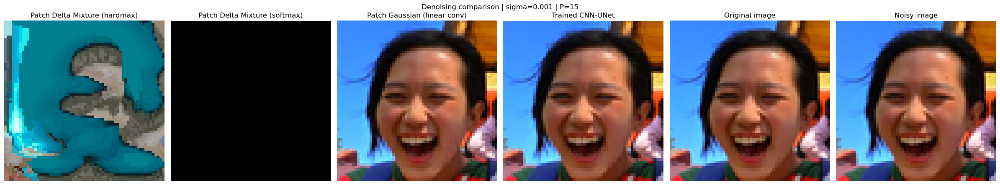

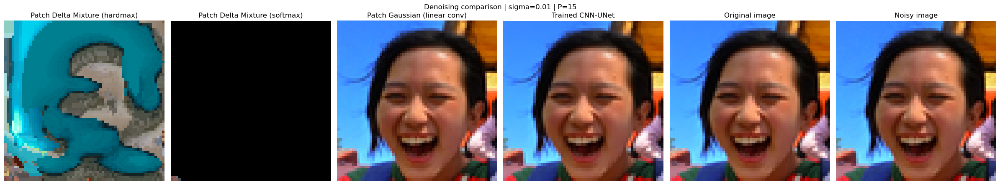

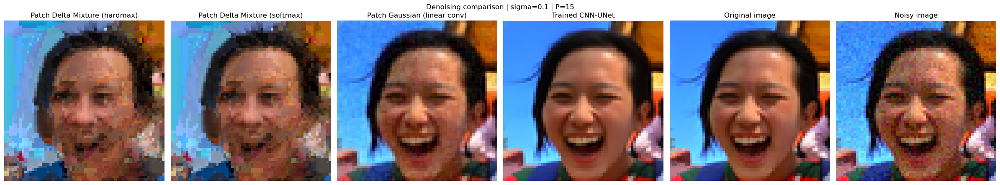

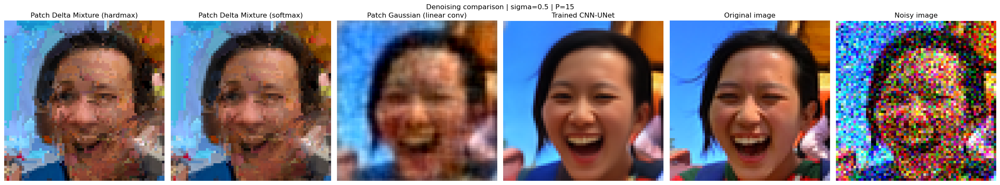

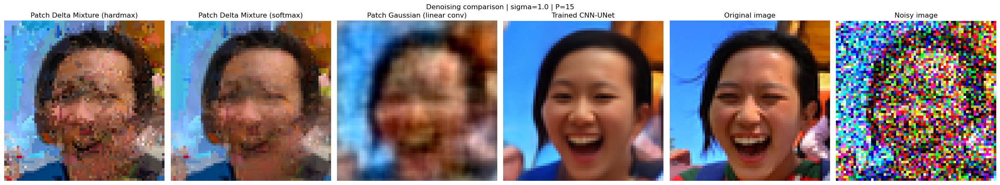

...

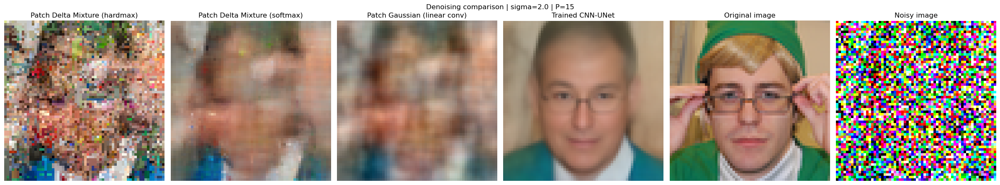

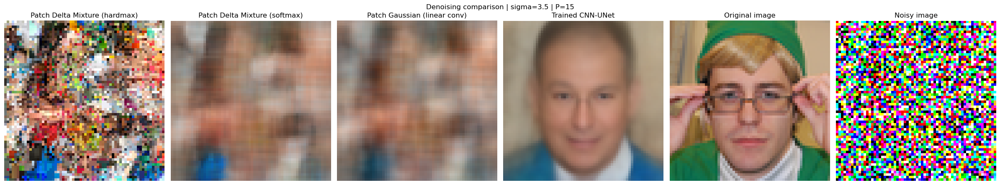

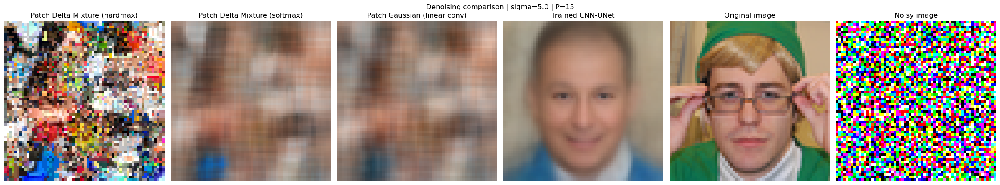

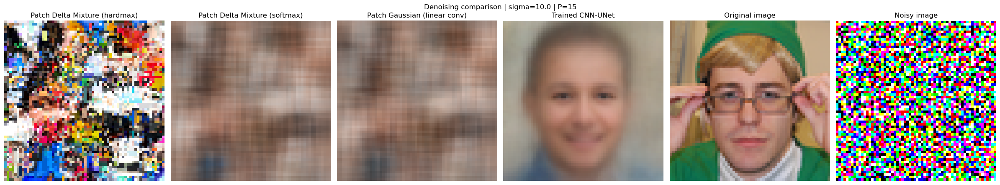

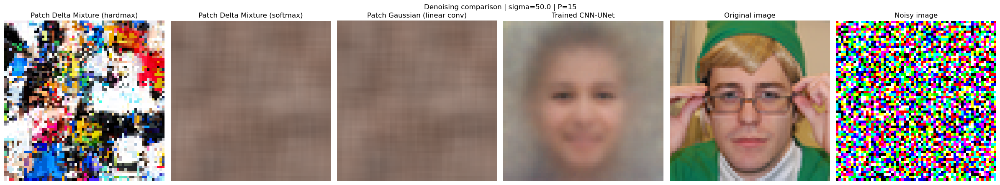

In [164]:
torch.cuda.empty_cache()
# get a new image and patchify it
ref_img_idx = 40009
noise_seed = 42
for ref_img_idx in range(40009, 40015):
    ref_x = fetch_ref_img_tsr(dataset, range(ref_img_idx, ref_img_idx+1))
    # noise_level = 1.0#1.25
    for noise_level in [0.001, 0.01, 0.1, 0.5, 1.0, 2.0, 3.5, 5.0, 10.0, 50.0]:
        x_probe = ref_x + noise_level * torch.randn(ref_x.shape, device=device, generator=torch.Generator(device=device).manual_seed(noise_seed))
        x_probe_patches = unfold(x_probe)
        print(x_probe_patches.shape)
        x_probe_patches_flatten = x_probe_patches.cuda().to(torch.float16)[0]
        
        with torch.no_grad():
            denoised_GaussianPatch = linconv_denoiser_dict[noise_level](x_probe)
            denoised_UNet = CNN_precd(x_probe, noise_level * torch.ones(x_probe.shape[0], device=x_probe.device))
        # Denoise using hardmax (nearest neighbor)
        denoised_nearest_hardmax = delta_mixture_denoise_image(
            x_probe_patches_flatten, train_patche_bank, 
            P, C_in, noise_level, patch_center_pixel, patchnorm, 
            softmax=False
        )
        denoised_nearest_softmax = delta_mixture_denoise_image(
            x_probe_patches_flatten, train_patche_bank, 
            P, C_in, noise_level, patch_center_pixel, patchnorm, 
            softmax=True
        )
        
        torch.cuda.empty_cache()
        # Example usage with current variables
        denoised_results = [
            (denoised_nearest_hardmax, "Patch Delta Mixture (hardmax)"),
            (denoised_nearest_softmax, "Patch Delta Mixture (softmax)"),
            (denoised_GaussianPatch, "Patch Gaussian (linear conv)"),
            (denoised_UNet, "Trained CNN-UNet"),
            (ref_x, "Original image"),
            (x_probe, "Noisy image")
        ]
        figh = plot_denoising_comparison(denoised_results, noise_level, P)
        figh.show()
        saveallforms(patchDMixture_savedir, f"patch_delta_mixture_denoiser_train1k_cmp_refimg{ref_img_idx}_sigma{noise_level}_P{P}", figh)
        pkl.dump(denoised_results, 
                 open(os.path.join(patchDMixture_savedir, f"patch_delta_mixture_denoiser_train1k_cmp_refimg{ref_img_idx}_sigma{noise_level}_P{P}.pkl"), "wb"))

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


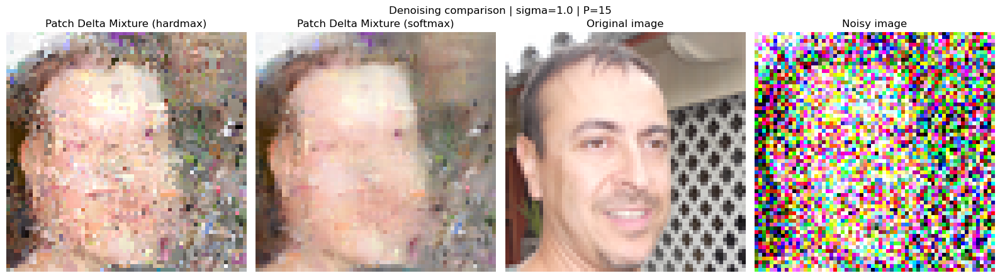

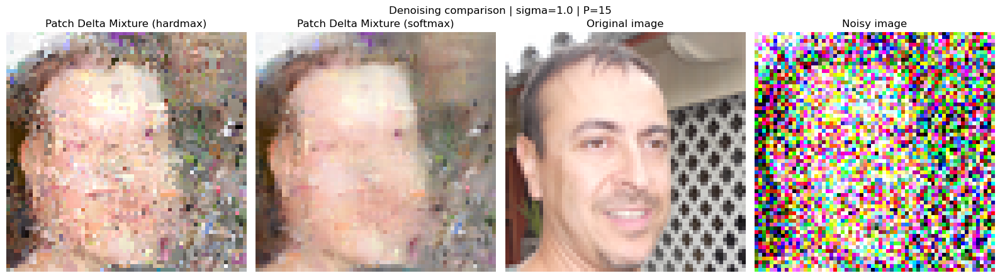

In [ ]:
# Example usage with current variables
denoised_results = [
    (denoised_nearest_hardmax, "Patch Delta Mixture (hardmax)"),
    (denoised_nearest_softmax, "Patch Delta Mixture (softmax)"),
    # (denoised_GaussianPatch, "Patch Gaussian (linear conv)"),
    (ref_x, "Original image"),
    (x_probe, "Noisy image")
]
figh = plot_denoising_comparison(denoised_results, noise_level, P)
figh.show()

In [165]:
denoised_results

[(tensor([[[ 0.9136,  1.0000,  1.0000,  ...,  0.6704,  0.2783,  0.7256],
           [-0.2313,  0.6313, -0.1137,  ...,  0.8354,  0.3882,  0.8354],
           [-0.6313, -0.9453, -0.2079,  ...,  1.0000,  0.9453,  0.9609],
           ...,
           [ 0.1921,  0.2705,  0.2549,  ...,  0.9292, -0.5449,  0.0823],
           [ 0.8198,  0.9531,  0.2471,  ...,  0.1921,  0.2627,  0.3411],
           [ 0.8198,  0.9531,  0.8979,  ..., -0.0118,  0.1843,  0.4666]],
  
          [[ 0.8276,  0.8667,  0.8037,  ...,  0.3333,  0.1216,  0.3960],
           [-0.2000,  0.4353, -0.5371,  ...,  0.7178,  0.2705,  0.7100],
           [-0.6470, -0.9609, -0.1765,  ...,  0.8823,  0.9922,  1.0000],
           ...,
           [-0.1216, -0.0510, -0.0510,  ...,  0.9688, -0.5688,  0.2235],
           [ 0.6943,  0.9922, -0.0510,  ...,  0.5059,  0.8667,  0.8823],
           [ 0.6943,  0.9922, -0.6548,  ...,  0.1843,  0.7256,  0.9609]],
  
          [[ 0.9058,  0.9688,  0.9292,  ...,  0.2627,  0.0588,  0.3333],
           

### Compute and Compare Gaussian denoiser 

In [111]:
denoiser_jacobian, denoiser_bias, W_center, b_center = compute_patch_Gaussian_denoiser(Xtsr64_1000, P, noise_level, device='cpu')
# build conv model
conv_GaussianPatch = torch.nn.Conv2d(C_in, C_out, kernel_size=P, padding=P//2, stride=1)
conv_GaussianPatch.weight.data = W_center
conv_GaussianPatch.bias.data = b_center
# test the conv model
with torch.no_grad():
    denoised_GaussianPatch = conv_GaussianPatch(x_probe)

Computing patch mean and covariance
torch.Size([1000, 675, 4096])
Computing patch Gaussian denoiser
torch.Size([3, 3, 15, 15])
torch.Size([3])


In [133]:
# build conv model
conv_GaussianPatch = torch.nn.Conv2d(C_in, C_out, kernel_size=P, padding=P//2, stride=1)
conv_GaussianPatch.weight.data = W_center
conv_GaussianPatch.bias.data = b_center
# test the conv model

with torch.no_grad():
    denoised_GaussianPatch = conv_GaussianPatch(x_probe)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


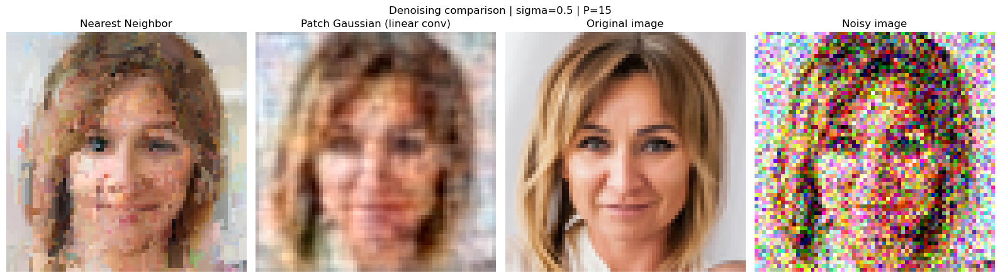

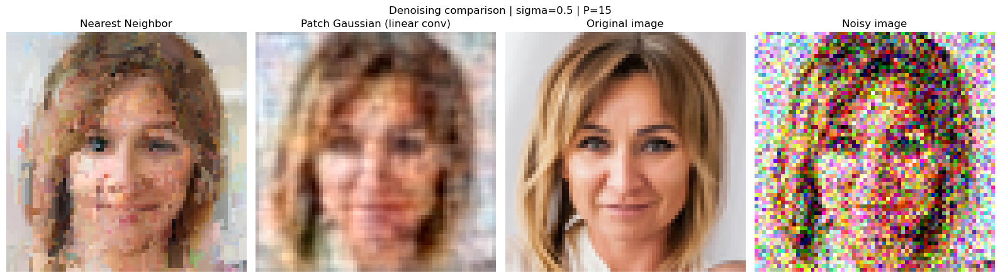

In [135]:


# Example usage with current variables
denoised_results = [
    (denoised_nearest, "Nearest Neighbor"),
    (denoised_GaussianPatch, "Patch Gaussian (linear conv)"),
    (ref_x, "Original image"),
    (x_probe, "Noisy image")
]
plot_denoising_comparison(denoised_results, noise_level, P)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


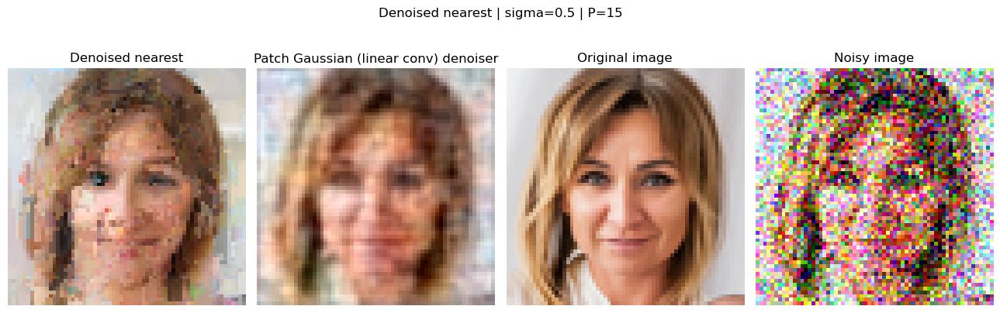

In [134]:
plt.figure(figsize=(13, 4.5))
plt.subplot(1, 4, 1)    
plt.imshow(denoised_nearest.permute(1, 2, 0).float() * 0.5 + 0.5)
plt.axis('off')
plt.title(f"Denoised nearest")
plt.subplot(1, 4, 2)
plt.imshow(denoised_GaussianPatch[0].permute(1, 2, 0).float() * 0.5 + 0.5)
plt.axis('off')
plt.title(f"Patch Gaussian (linear conv) denoiser")

plt.subplot(1, 4, 3)
plt.imshow(ref_x[0].permute(1, 2, 0).float() * 0.5 + 0.5)
plt.axis('off')
plt.title(f"Original image")
plt.subplot(1, 4, 4)
plt.imshow(x_probe[0].permute(1, 2, 0).float() * 0.5 + 0.5)
plt.axis('off')
plt.title(f"Noisy image")
plt.suptitle(f"Denoised nearest | sigma={noise_level} | P={P}")
plt.tight_layout()

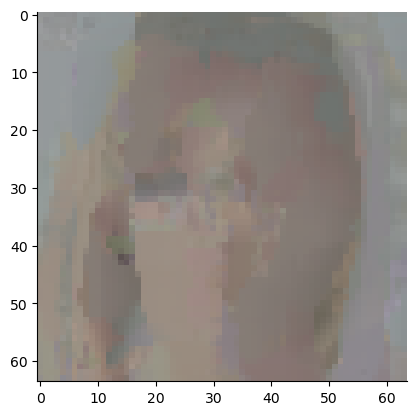

In [107]:
plt.imshow(denoised_nearest.permute(1, 2, 0).float() * 0.5 + 0.5)
plt.show()

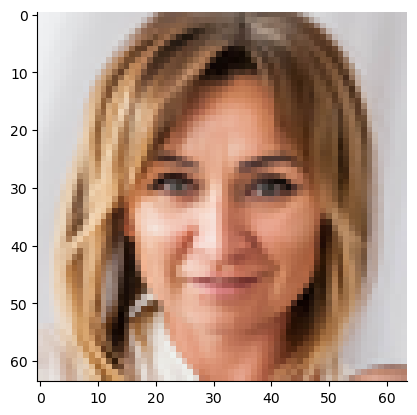

In [99]:
plt.imshow(ref_x[0].permute(1, 2, 0).float() * 0.5 + 0.5)
plt.show()

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


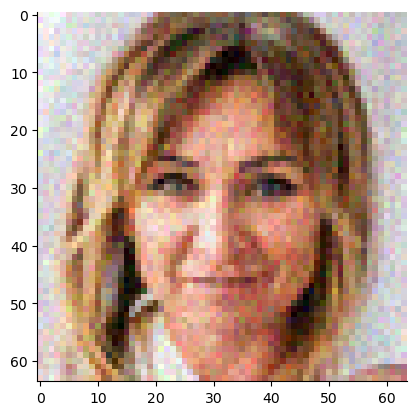

In [100]:
plt.imshow(x_probe[0].permute(1, 2, 0).float() * 0.5 + 0.5)
plt.show()

In [168]:
torch.cuda.empty_cache()

### Gaussian Mixture (Kmeans initialization)

In [33]:
patch_center_pixel.shape

torch.Size([4096000, 3])

In [29]:
X.shape[0]

1000

In [31]:
patch_center_pixel.shape

torch.Size([4096000, 3])

In [ ]:
innerprod = train_patche_bank @ x_probe_patches_flatten[0]
patchnorm = (train_patche_bank**2).sum(dim=1)

In [ ]:
attn_score = torch.softmax((train_patche_bank @ x_probe_patches_flatten[0] - \
                            2 * (train_patche_bank**2).sum(dim=1)[:, None]) / noise_level ** 2, dim=0).cpu()
torch.cuda.empty_cache()

In [51]:
attn_score.shape

torch.Size([2048000, 4096])

In [43]:
attn_score = torch.softmax((innerprod.cpu() - 2 * patchnorm[:, None].cpu()) / noise_level ** 2, dim=0)

In [42]:
patchnorm.mean()

tensor(180.2500, device='cuda:0', dtype=torch.float16)

In [15]:
# Perform K-means clustering on the patches
from sklearn.cluster import MiniBatchKMeans
import numpy as np

# Define number of clusters
n_clusters = 20
print(f"Performing K-means clustering with {n_clusters} clusters")
# Convert to numpy for efficient clustering
X_patches_np = X_patches_flatten.cpu().numpy()
# Use MiniBatchKMeans for memory efficiency
kmeans = MiniBatchKMeans(
    n_clusters=n_clusters,
    batch_size=1024,
    random_state=42,
    n_init="auto"
)
# Fit the model
print("Fitting K-means model...")
cluster_labels = kmeans.fit_predict(X_patches_np)
print(f"Clustering complete. Found {n_clusters} clusters with sizes:")
# Convert labels back to tensor
cluster_labels_tensor = torch.tensor(cluster_labels, device=device)
# Calculate cluster statistics
cluster_sizes = []
cluster_means = []
cluster_covs = []
for i in range(n_clusters):
    # Get patches belonging to this cluster
    mask = cluster_labels_tensor == i
    cluster_size = mask.sum().item()
    cluster_sizes.append(cluster_size)
    print(f"Cluster {i}: {cluster_size} patches ({cluster_size/len(cluster_labels_tensor)*100:.2f}%)")
    # Calculate mean and covariance for this cluster
    if cluster_size > 0:
        cluster_patches = X_patches_flatten[mask]
        cluster_mean = cluster_patches.mean(dim=0)
        cluster_means.append(cluster_mean)
        # For large clusters, compute covariance efficiently
        if cluster_size > 10000:
            print(f"Computing covariance for large cluster {i} efficiently...")
            # Sample a subset for covariance estimation
            sample_size = min(10000, cluster_size)
            sample_indices = torch.randperm(cluster_size, device=device)[:sample_size]
            sampled_patches = cluster_patches[sample_indices]
            cluster_cov = torch.cov(sampled_patches.T)
        else:
            cluster_cov = torch.cov(cluster_patches.T)
        
        cluster_covs.append(cluster_cov)

# Convert lists to tensors
cluster_means = torch.stack(cluster_means)
print(f"Cluster means shape: {cluster_means.shape}")


Performing K-means clustering with 20 clusters
Fitting K-means model...
Clustering complete. Found 20 clusters with sizes:
Cluster 0: 292623 patches (4.76%)
Computing covariance for large cluster 0 efficiently...
Cluster 1: 305852 patches (4.98%)
Computing covariance for large cluster 1 efficiently...
Cluster 2: 260796 patches (4.24%)
Computing covariance for large cluster 2 efficiently...
Cluster 3: 321346 patches (5.23%)
Computing covariance for large cluster 3 efficiently...
Cluster 4: 464811 patches (7.57%)
Computing covariance for large cluster 4 efficiently...
Cluster 5: 216976 patches (3.53%)
Computing covariance for large cluster 5 efficiently...
Cluster 6: 265733 patches (4.33%)
Computing covariance for large cluster 6 efficiently...
Cluster 7: 177997 patches (2.90%)
Computing covariance for large cluster 7 efficiently...
Cluster 8: 279402 patches (4.55%)
Computing covariance for large cluster 8 efficiently...
Cluster 9: 268954 patches (4.38%)
Computing covariance for large cl

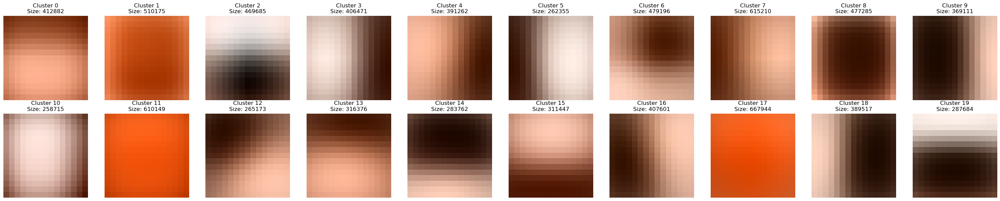

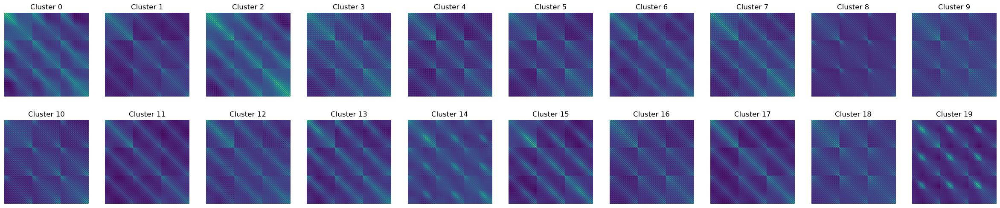

/n/home12/binxuwang/.conda/envs/torch2/lib/python3.10/site-packages/torch/_tensor.py:1089: ComplexWarning: Casting complex values to real discards the imaginary part
  return self.numpy().astype(dtype, copy=False)


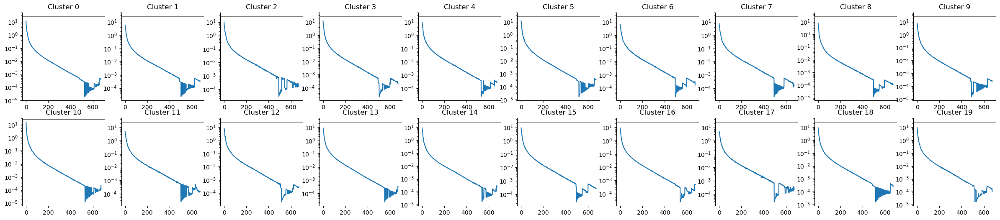

In [27]:
# Visualize cluster centers (if 3-channel images)
if C_in == 3 and P in [3, 5, 7, 9, 11, 13, 15]:
    max_columns = 10
    import matplotlib.pyplot as plt
    from matplotlib import cm
    n_cols = min(n_clusters, max_columns)
    n_rows = (n_clusters + n_cols - 1) // n_cols
    fig, axes = plt.subplots(n_rows, n_cols, figsize=(n_cols*3, n_rows*3))
    if n_clusters == 1:
        axes = [axes]
    axes = axes.flatten()
    for i, ax in enumerate(axes):
        # Reshape cluster mean to patch shape
        patch_viz = cluster_means[i].reshape(C_in, P, P).permute(1, 2, 0).cpu()
        # Normalize for visualization
        patch_viz = (patch_viz - patch_viz.min()) / (patch_viz.max() - patch_viz.min())
        
        ax.imshow(patch_viz)
        ax.set_title(f"Cluster {i}\nSize: {cluster_sizes[i]}")
        ax.axis('off')
    
    plt.tight_layout()
    plt.show()
    
# plot the covariance matrix of each cluster
figh, axh = plt.subplots(n_rows, n_cols, figsize=(n_cols*3, n_rows*3))
if n_clusters == 1:
    axh = [axh]
axh = axh.flatten()
for i, ax in enumerate(axh):
    ax.imshow(cluster_covs[i])
    ax.set_title(f"Cluster {i}")
    ax.axis('off')
plt.show()

# plot the spectrum of covariance matrix of each cluster
figh, axh = plt.subplots(n_rows, n_cols, figsize=(n_cols*3, n_rows*3))
if n_clusters == 1:
    axh = [axh]
axh = axh.flatten()
for i, ax in enumerate(axh):
    ax.plot(torch.linalg.eigvals(cluster_covs[i]))
    ax.set_title(f"Cluster {i}")
    ax.set_yscale("log")
    ax.axhline(noise_level**2, color="k", alpha=0.5)
plt.show()

In [24]:
torch.linalg.eigvals(cluster_covs[i])

tensor([9.9354e+00+0.j, 8.1432e+00+0.j, 6.2650e+00+0.j, 5.7389e+00+0.j, 4.8007e+00+0.j,
        4.3802e+00+0.j, 3.0756e+00+0.j, 2.3288e+00+0.j, 1.7415e+00+0.j, 1.6719e+00+0.j,
        1.3891e+00+0.j, 1.1922e+00+0.j, 1.1680e+00+0.j, 9.6450e-01+0.j, 8.9410e-01+0.j,
        8.5659e-01+0.j, 7.6554e-01+0.j, 7.4194e-01+0.j, 6.4055e-01+0.j, 5.6172e-01+0.j,
        5.5980e-01+0.j, 5.4423e-01+0.j, 4.9785e-01+0.j, 4.1866e-01+0.j, 3.8543e-01+0.j,
        3.7919e-01+0.j, 3.5234e-01+0.j, 3.4561e-01+0.j, 3.3838e-01+0.j, 3.1590e-01+0.j,
        2.9161e-01+0.j, 2.8209e-01+0.j, 2.6916e-01+0.j, 2.6286e-01+0.j, 2.3640e-01+0.j,
        2.3175e-01+0.j, 2.2477e-01+0.j, 2.2026e-01+0.j, 2.1230e-01+0.j, 1.9972e-01+0.j,
        1.9415e-01+0.j, 1.8939e-01+0.j, 1.8096e-01+0.j, 1.6588e-01+0.j, 1.6380e-01+0.j,
        1.5962e-01+0.j, 1.5551e-01+0.j, 1.4944e-01+0.j, 1.4372e-01+0.j, 1.3971e-01+0.j,
        1.3604e-01+0.j, 1.3492e-01+0.j, 1.2689e-01+0.j, 1.1656e-01+0.j, 1.1446e-01+0.j,
        1.1038e-01+0.j, 1.0983e-

In [ ]:
# Function to compute Gaussian denoiser for each cluster
def compute_cluster_denoisers(cluster_means, cluster_covs, noise_level, P, C_in, device):
    sigma = noise_level
    denoisers = []
    raise Exception
    for i in range(len(cluster_means)):
        cluster_mean = cluster_means[i]
        cluster_cov = cluster_covs[i]
        
        eye_mat = torch.eye(cluster_cov.shape[0], device=device)
        denoiser_jacobian = cluster_cov @ torch.linalg.inv(cluster_cov + eye_mat * sigma ** 2)
        denoiser_bias = (eye_mat - denoiser_jacobian) @ cluster_mean
        
        W_center = denoiser_jacobian.view(C_in, P, P, C_in, P, P)[:, P//2, P//2, :, :, :]
        b_center = denoiser_bias.view(C_in, P, P)[:, P//2, P//2]
        
        denoisers.append((denoiser_jacobian, denoiser_bias, W_center, b_center))
    
    return denoisers

# Compute denoisers for each cluster
print(f"Computing Gaussian denoisers for each cluster with noise level {noise_level}...")
cluster_denoisers = compute_cluster_denoisers(cluster_means, cluster_covs, noise_level, P, C_in, device)

### More accurate GMM estimate... but very inefficient

In [ ]:
from sklearn.cluster import MiniBatchKMeans
from sklearn.mixture import GaussianMixture
K = 10
X_patches_np = X_patches_flatten.cpu().numpy()
# 1) run mini‐batch KMeans on your data in chunks
print("Running mini‐batch KMeans")
mbk = MiniBatchKMeans(n_clusters=K, batch_size=1024, random_state=42, n_init="auto", verbose=1)
mbk.fit(X_patches_np)                           # X can be a memory‐mapped array or large in‐RAM
print("Mini‐batch KMeans done | fitting GaussianMixture")
# 2) grab cluster centers
means_init = mbk.cluster_centers_
# 3) plug into GaussianMixture
gmm = GaussianMixture(
    n_components=K,
    covariance_type='full',
    init_params='random',           # we'll supply our own means
    means_init=means_init,
    reg_covar=1e-6,
    max_iter=100,
    tol=1e-3,
    random_state=42,
    verbose=1,
)
gmm.fit(X_patches_np)                          # you still do EM on all data, but now with better init
print("GaussianMixture done")

Running mini‐batch KMeans
Init 1/1 with method k-means++
Inertia for init 1/1: 339190.625
Minibatch step 1/800000: mean batch inertia: 105.65534210205078
Minibatch step 2/800000: mean batch inertia: 82.43881225585938, ewa inertia: 82.43881225585938
Minibatch step 3/800000: mean batch inertia: 82.7032699584961, ewa inertia: 82.43887837027697
Minibatch step 4/800000: mean batch inertia: 80.17498016357422, ewa inertia: 82.43831239579438
Minibatch step 5/800000: mean batch inertia: 82.37983703613281, ewa inertia: 82.43829777695626
Minibatch step 6/800000: mean batch inertia: 81.03675079345703, ewa inertia: 82.43794739025316
Minibatch step 7/800000: mean batch inertia: 78.25101470947266, ewa inertia: 82.43690065721074
Minibatch step 8/800000: mean batch inertia: 82.31580352783203, ewa inertia: 82.43687038293209
Minibatch step 9/800000: mean batch inertia: 79.92704010009766, ewa inertia: 82.43624292543797
Minibatch step 10/800000: mean batch inertia: 78.80230712890625, ewa inertia: 82.435334

: 

### Compare Gausian denoiser and optimal denoiser throughout training

In [ ]:
noise_level = 2.5
step = ckpt_step_list[20]
CNN_precd.load_state_dict(torch.load(join(ckptdir, f"model_epoch_{step:06d}.pth")))
CNN_precd = CNN_precd.to(device).eval()
CNN_precd.requires_grad_(False);

ref_xs = fetch_ref_img_tsr(dataset, range(100))
noise_z = torch.randn((100, *imgsize), device=device, 
        generator=torch.Generator(device=device).manual_seed(noise_seed))
test_ref_x = fetch_ref_img_tsr(dataset, range(100,200))
test_noise_z = torch.randn((100, *imgsize), device=device, 
        generator=torch.Generator(device=device).manual_seed(noise_seed+1))
x_probe = ref_xs.to(device) + noise_level * noise_z
t_sigma = noise_level * torch.ones(noise_z.shape[0], device=device)
test_x_probe = test_ref_x.to(device) + noise_level * test_noise_z
test_t_sigma = noise_level * torch.ones(test_noise_z.shape[0], device=device)
with torch.no_grad():
    denoised = CNN_precd(x_probe.to(device), t_sigma)
    test_denoised = CNN_precd(test_x_probe.to(device), test_t_sigma)
    
conv_closedform, mse_closedform, mse_conv = fit_linear_conv_denoiser(
    x_probe=x_probe, denoised=denoised, 
    kernel_size=P, lambda_reg=1e-3, device=device
)
eval_linear_conv_denoiser(conv_closedform, test_x_probe.cuda(), 
                          test_denoised.cuda());

NameError: name 'ckpt_step_list' is not defined

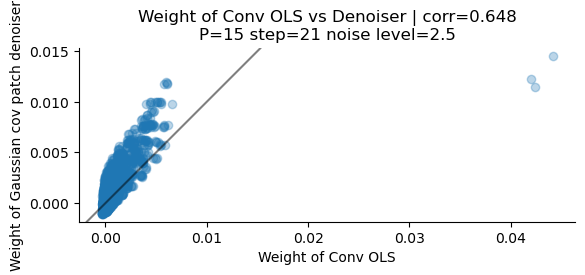

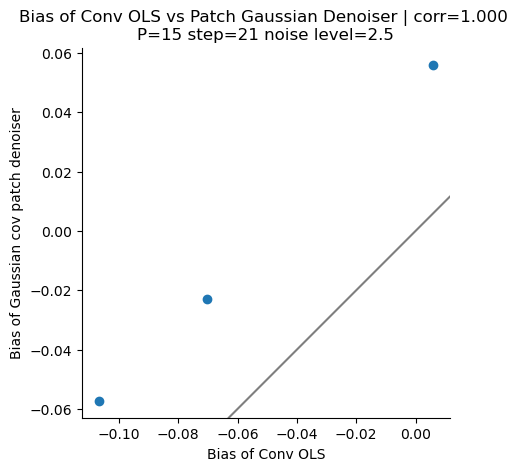

In [ ]:
# correlate the center of the kernel with the weight of the conv model
weight_conv_OLS = conv_closedform.weight.data.detach().cpu()
weight_cov_inv_denoiser = W_center.cpu()
# perform corrcoef
corr = torch.corrcoef(torch.stack([weight_conv_OLS.flatten(), weight_cov_inv_denoiser.flatten()]))[0, 1]
plt.plot(weight_conv_OLS.flatten(), weight_cov_inv_denoiser.flatten(), "o", alpha=0.3)
plt.axline((0, 0), slope=1, color="k", alpha=0.5)
plt.axis("image")
plt.xlabel("Weight of Conv OLS")
plt.ylabel("Weight of Gaussian cov patch denoiser")
plt.title(f"Weight of Conv OLS vs Denoiser | corr={corr:.3f}\nP={P} step={step} noise level={noise_level}")
plt.show()

bias_conv_OLS = conv_closedform.bias.data.detach().cpu()
bias_center = b_center.view(-1).cpu()
corr = torch.corrcoef(torch.stack([bias_conv_OLS, bias_center]))[0, 1]  
plt.plot(bias_conv_OLS, bias_center, "o")
plt.axline((0, 0), slope=1, color="k", alpha=0.5)
plt.axis("image")
plt.xlabel("Bias of Conv OLS")
plt.ylabel("Bias of Gaussian cov patch denoiser")
plt.title(f"Bias of Conv OLS vs Patch Gaussian Denoiser | corr={corr:.3f} \nP={P} step={step} noise level={noise_level}")
plt.show()

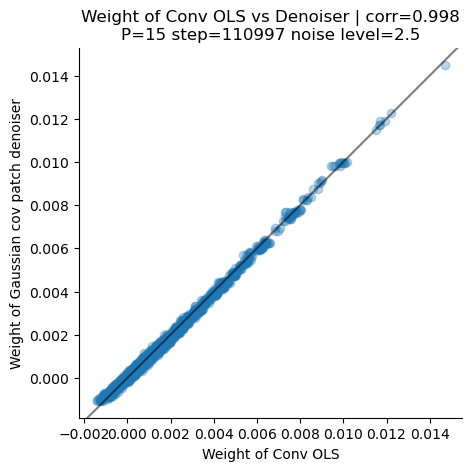

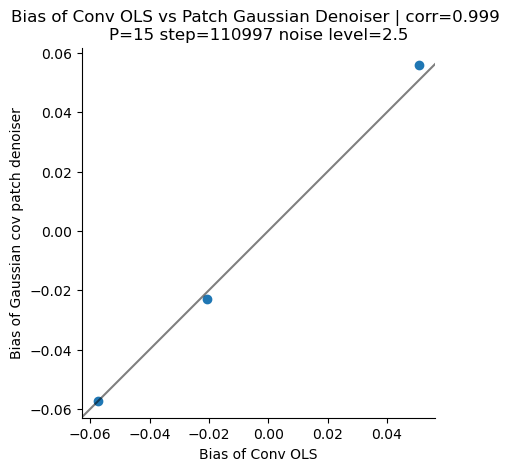

In [ ]:
# correlate the center of the kernel with the weight of the conv model
weight_conv_OLS = conv_closedform.weight.data.detach().cpu()
weight_cov_inv_denoiser = W_center.cpu()
# perform corrcoef
corr = torch.corrcoef(torch.stack([weight_conv_OLS.flatten(), weight_cov_inv_denoiser.flatten()]))[0, 1]
plt.plot(weight_conv_OLS.flatten(), weight_cov_inv_denoiser.flatten(), "o", alpha=0.3)
plt.axline((0, 0), slope=1, color="k", alpha=0.5)
plt.axis("image")
plt.xlabel("Weight of Conv OLS")
plt.ylabel("Weight of Gaussian cov patch denoiser")
plt.title(f"Weight of Conv OLS vs Denoiser | corr={corr:.3f}\nP={P} step={step} noise level={noise_level}")
plt.show()

bias_conv_OLS = conv_closedform.bias.data.detach().cpu()
bias_center = b_center.view(-1).cpu()
corr = torch.corrcoef(torch.stack([bias_conv_OLS, bias_center]))[0, 1]  
plt.plot(bias_conv_OLS, bias_center, "o")
plt.axline((0, 0), slope=1, color="k", alpha=0.5)
plt.axis("image")
plt.xlabel("Bias of Conv OLS")
plt.ylabel("Bias of Gaussian cov patch denoiser")
plt.title(f"Bias of Conv OLS vs Patch Gaussian Denoiser | corr={corr:.3f} \nP={P} step={step} noise level={noise_level}")
plt.show()

### Visualize the denoising effect of Gaussian patch denoiser

In [ ]:
# build the conv layer from the Gaussian patch denoiser
C_in = Xtsr64_1000.shape[1]
C_out = Xtsr64_1000.shape[1]
conv_GaussPatch = torch.nn.Conv2d(C_in, C_out, kernel_size=P, padding=P//2, stride=1)
conv_GaussPatch.weight.data = W_center
conv_GaussPatch.bias.data = b_center

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


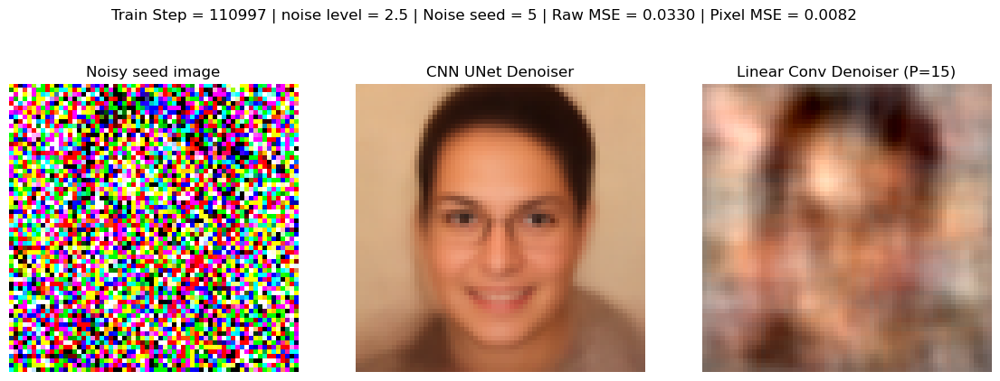

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


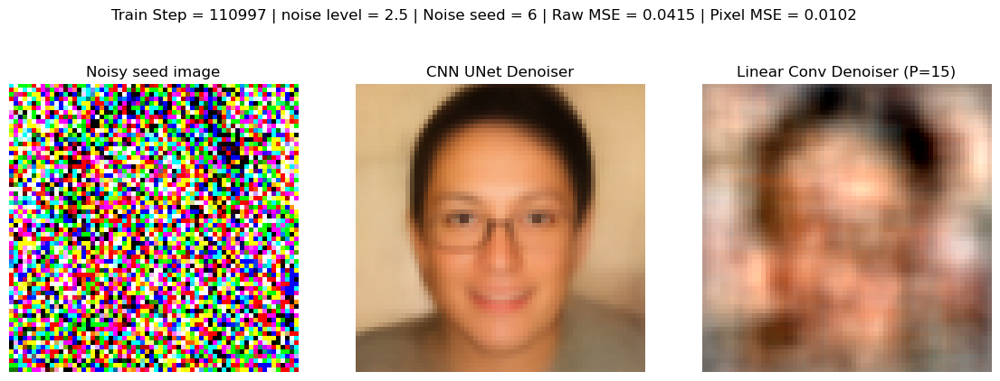

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


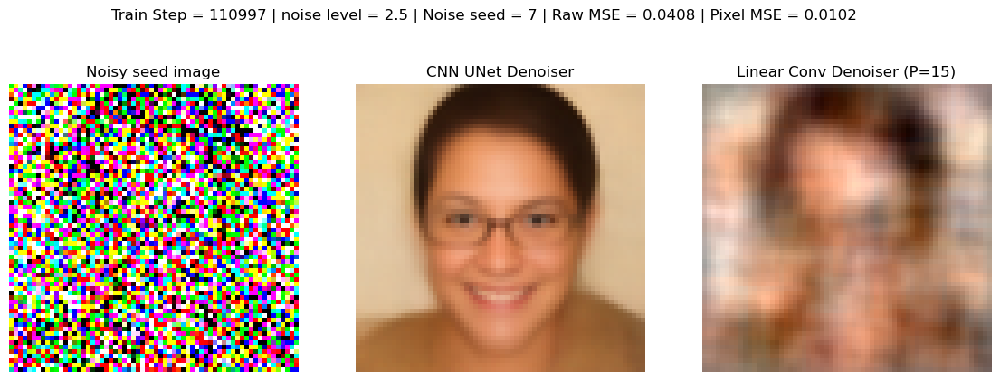

In [ ]:
noise_level = 2.5
step = ckpt_step_list[-1]
CNN_precd.load_state_dict(torch.load(join(ckptdir, f"model_epoch_{step:06d}.pth")))
CNN_precd = CNN_precd.to(device).eval()
CNN_precd.requires_grad_(False);

ref_xs = fetch_ref_img_tsr(dataset, 37)
noise_seeds = range(5,8)
visualize_denoiser_comparison(
    ref_xs, 
    CNN_precd=CNN_precd, 
    conv_closedform=conv_GaussPatch, 
    noise_seeds=noise_seeds, 
    noise_level=noise_level, 
    P=P, device=device)